#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,2048],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_feature"
models_saves = "model_saves"

In [4]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [5]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=36, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [7]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 2048])

In [8]:
emb

tensor([[0.7284, 0.0000, 1.3672,  ..., 0.2560, 0.0000, 1.3808],
        [0.6442, 0.5983, 0.0000,  ..., 0.0000, 0.4085, 1.0015],
        [0.0000, 0.7755, 0.6820,  ..., 0.0000, 0.0000, 0.7157],
        ...,
        [0.0000, 0.3271, 0.0000,  ..., 0.0000, 0.0000, 0.7265],
        [0.8166, 0.0000, 1.1537,  ..., 0.3636, 0.0000, 0.0000],
        [0.0000, 0.0000, 1.2160,  ..., 2.0236, 0.0000, 0.0000]],
       grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [13]:
dts = PAMAP2Dataset

In [14]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_2048.npz')
video_classes, video_feat = video_data['activity'], video_data['features']

In [15]:
video_feat.shape

(180, 2048)

In [16]:
np.unique(video_classes, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [17]:
vid_cls_name = np.unique(video_classes)

In [18]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [19]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 2048])

In [20]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [21]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [22]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [23]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [24]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [25]:
data_dict.keys()

dict_keys(['train', 'eval-seen', 'test', 'seen_classes', 'unseen_classes'])

In [26]:
data_dict['train']['X'].shape,data_dict['eval-seen']['X'].shape,data_dict["test"]["X"].shape

((16752, 36), (4189, 36), (5608, 36))

In [27]:
data_dict['train']['X'].shape[0]+data_dict['eval-seen']['X'].shape[0]+data_dict["test"]["X"].shape[0]

26549

In [28]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [29]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [30]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [31]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [32]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [33]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 2048])

In [34]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [35]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [36]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [37]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 261/261 [00:42<00:00,  6.19batch/s, loss=11.2, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.19batch/s, loss=10.7]


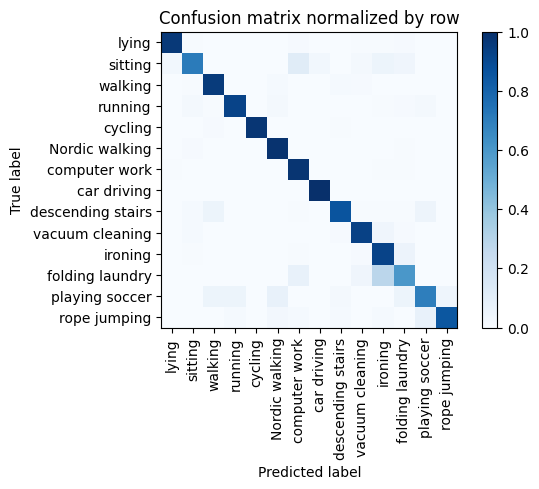

Training Epoch:   7%|▋         | 1/15 [00:47<11:00, 47.16s/it]

Overall accuracy: 0.906

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.898      0.977      0.936      0.145        605|	 folding laundry: 0.007,	ironing: 0.005,	
          ironing       0.816      0.923      0.866      0.112        466|	 folding laundry: 0.056,	vacuum cleaning: 0.009,	
          walking       0.955      0.957      0.956      0.111        463|	 descending stairs: 0.013,	Nordic walking: 0.013,	
          sitting       0.920      0.709      0.801      0.093        388|	 computer work: 0.116,	ironing: 0.052,	
            lying       0.960      0.963      0.962      0.091        378|	 folding laundry: 0.008,	computer work: 0.008,	
   Nordic walking       0.951      0.986      0.968      0.086        357|	 sitting: 0.008,	folding laundry: 0.006,	
  vacuum cleaning       0.914      0.931      0.922      0.080        331|	 ironing: 0.039,	sitting: 0.012,	
          cycling       1.000      0.973      0.98


train: 100%|██████████| 261/261 [00:40<00:00,  6.51batch/s, loss=11.4, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.21batch/s, loss=10.9]


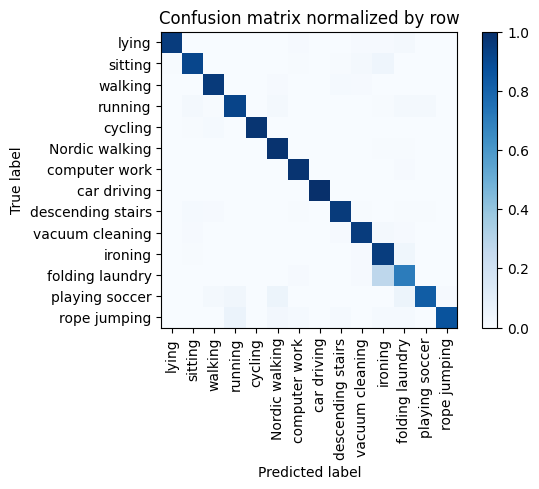

Training Epoch:  13%|█▎        | 2/15 [01:32<09:55, 45.81s/it]

Overall accuracy: 0.942

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.983      0.983      0.144        597|	 folding laundry: 0.010,	ironing: 0.003,	
          ironing       0.835      0.946      0.887      0.112        465|	 folding laundry: 0.039,	vacuum cleaning: 0.009,	
          walking       0.978      0.959      0.968      0.111        463|	 descending stairs: 0.015,	vacuum cleaning: 0.011,	
          sitting       0.954      0.913      0.933      0.094        390|	 ironing: 0.044,	vacuum cleaning: 0.021,	
            lying       0.995      0.953      0.973      0.092        382|	 folding laundry: 0.016,	ironing: 0.010,	
   Nordic walking       0.959      0.986      0.972      0.086        356|	 folding laundry: 0.006,	ironing: 0.006,	
  vacuum cleaning       0.926      0.952      0.939      0.079        330|	 ironing: 0.021,	folding laundry: 0.009,	
          cycling       1.000      0.980     


train: 100%|██████████| 261/261 [00:40<00:00,  6.50batch/s, loss=11.4, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:03<00:00, 17.22batch/s, loss=10.6]


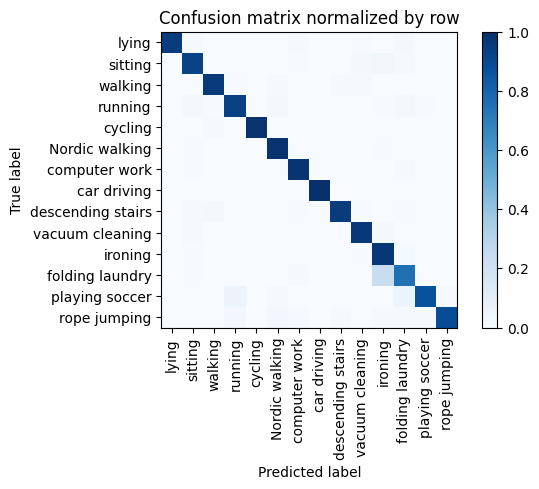

Training Epoch:  20%|██        | 3/15 [02:16<09:01, 45.14s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.980      0.982      0.981      0.145        602|	 folding laundry: 0.008,	sitting: 0.005,	
          ironing       0.864      0.972      0.915      0.112        465|	 folding laundry: 0.015,	vacuum cleaning: 0.006,	
          walking       0.978      0.963      0.971      0.111        463|	 vacuum cleaning: 0.013,	descending stairs: 0.009,	
          sitting       0.935      0.923      0.929      0.094        389|	 ironing: 0.036,	vacuum cleaning: 0.018,	
            lying       1.000      0.950      0.974      0.091        378|	 folding laundry: 0.016,	computer work: 0.013,	
   Nordic walking       0.972      0.986      0.979      0.086        358|	 ironing: 0.006,	sitting: 0.006,	
  vacuum cleaning       0.938      0.967      0.952      0.079        330|	 ironing: 0.021,	sitting: 0.009,	
          cycling       1.000      0.987      0.993    


train: 100%|██████████| 261/261 [00:39<00:00,  6.62batch/s, loss=11.2, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 16.14batch/s, loss=10.9]


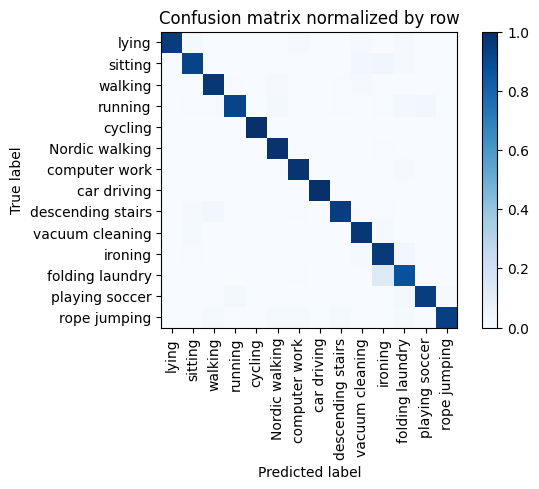

Training Epoch:  27%|██▋       | 4/15 [03:00<08:10, 44.62s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.982      0.984      0.145        604|	 folding laundry: 0.010,	vacuum cleaning: 0.003,	
          ironing       0.903      0.959      0.930      0.112        467|	 folding laundry: 0.024,	vacuum cleaning: 0.013,	
          walking       0.978      0.972      0.975      0.112        464|	 vacuum cleaning: 0.009,	Nordic walking: 0.009,	
          sitting       0.952      0.923      0.937      0.094        389|	 ironing: 0.036,	vacuum cleaning: 0.026,	
            lying       0.997      0.955      0.976      0.091        378|	 sitting: 0.016,	folding laundry: 0.011,	
   Nordic walking       0.978      0.986      0.982      0.086        356|	 ironing: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.925      0.970      0.947      0.080        331|	 ironing: 0.015,	sitting: 0.012,	
          cycling       1.000      0.997      0.


train: 100%|██████████| 261/261 [00:41<00:00,  6.29batch/s, loss=11.3, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:03<00:00, 16.98batch/s, loss=10.4]


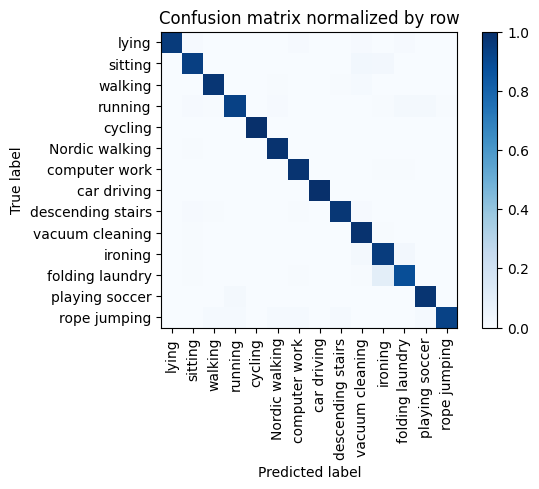

Training Epoch:  33%|███▎      | 5/15 [03:45<07:30, 45.01s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.983      0.985      0.144        601|	 folding laundry: 0.005,	ironing: 0.005,	
          ironing       0.923      0.951      0.936      0.112        465|	 folding laundry: 0.026,	vacuum cleaning: 0.019,	
          walking       0.993      0.974      0.984      0.112        464|	 vacuum cleaning: 0.013,	descending stairs: 0.006,	
          sitting       0.958      0.941      0.949      0.094        389|	 vacuum cleaning: 0.031,	ironing: 0.026,	
            lying       1.000      0.955      0.977      0.091        379|	 vacuum cleaning: 0.011,	computer work: 0.011,	
   Nordic walking       0.983      0.986      0.985      0.086        358|	 sitting: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.901      0.985      0.941      0.080        332|	 ironing: 0.006,	sitting: 0.006,	
          cycling       1.000      1.000      1


train: 100%|██████████| 261/261 [00:40<00:00,  6.37batch/s, loss=10.6, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:03<00:00, 16.49batch/s, loss=10.3]


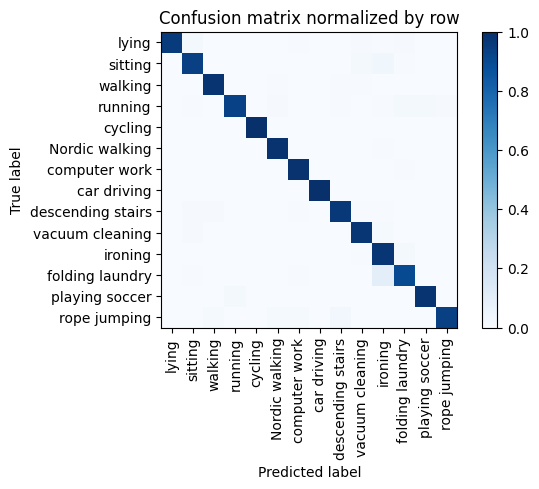

Training Epoch:  40%|████      | 6/15 [04:31<06:46, 45.12s/it]

Overall accuracy: 0.968

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.985      0.987      0.144        601|	 folding laundry: 0.005,	ironing: 0.003,	
          walking       0.991      0.978      0.985      0.112        464|	 vacuum cleaning: 0.006,	descending stairs: 0.006,	
          ironing       0.907      0.974      0.940      0.111        463|	 folding laundry: 0.019,	vacuum cleaning: 0.004,	
          sitting       0.953      0.934      0.943      0.094        392|	 ironing: 0.038,	vacuum cleaning: 0.018,	
            lying       1.000      0.955      0.977      0.091        380|	 sitting: 0.016,	folding laundry: 0.008,	
   Nordic walking       0.983      0.986      0.985      0.086        358|	 ironing: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.947      0.976      0.961      0.079        328|	 ironing: 0.015,	sitting: 0.009,	
          cycling       1.000      1.000      1.000  


train: 100%|██████████| 261/261 [00:41<00:00,  6.31batch/s, loss=11, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 16.21batch/s, loss=10.6]


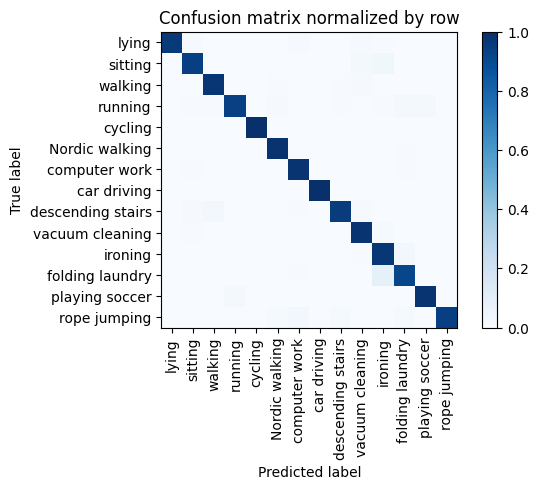

Training Epoch:  47%|████▋     | 7/15 [05:16<06:02, 45.32s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.985      0.983      0.984      0.145        604|	 folding laundry: 0.007,	sitting: 0.005,	
          ironing       0.918      0.970      0.943      0.111        463|	 folding laundry: 0.024,	vacuum cleaning: 0.004,	
          walking       0.987      0.974      0.980      0.111        461|	 vacuum cleaning: 0.011,	descending stairs: 0.007,	
          sitting       0.961      0.938      0.949      0.094        389|	 ironing: 0.039,	vacuum cleaning: 0.018,	
            lying       1.000      0.963      0.981      0.091        380|	 computer work: 0.011,	sitting: 0.011,	
   Nordic walking       0.983      0.986      0.985      0.086        356|	 folding laundry: 0.006,	ironing: 0.003,	
  vacuum cleaning       0.942      0.982      0.961      0.079        328|	 ironing: 0.012,	sitting: 0.006,	
          cycling       1.000      1.000      1.000    


train: 100%|██████████| 261/261 [00:41<00:00,  6.34batch/s, loss=9.63, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:03<00:00, 16.54batch/s, loss=9.43]


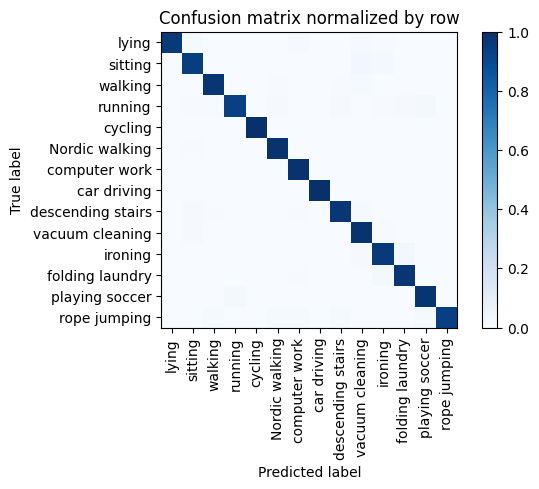

Training Epoch:  53%|█████▎    | 8/15 [06:02<05:17, 45.38s/it]

Overall accuracy: 0.973

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.987      0.987      0.144        597|	 folding laundry: 0.003,	vacuum cleaning: 0.003,	
          walking       0.991      0.974      0.983      0.112        464|	 vacuum cleaning: 0.015,	Nordic walking: 0.006,	
          ironing       0.957      0.961      0.959      0.111        463|	 folding laundry: 0.026,	vacuum cleaning: 0.011,	
          sitting       0.958      0.948      0.953      0.093        388|	 vacuum cleaning: 0.026,	ironing: 0.023,	
            lying       1.000      0.961      0.980      0.091        380|	 sitting: 0.013,	vacuum cleaning: 0.008,	
   Nordic walking       0.983      0.986      0.985      0.086        357|	 sitting: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.918      0.985      0.950      0.080        331|	 sitting: 0.009,	ironing: 0.006,	
          cycling       1.000      1.000      1.


train: 100%|██████████| 261/261 [00:42<00:00,  6.11batch/s, loss=10.2, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.62batch/s, loss=9.58]


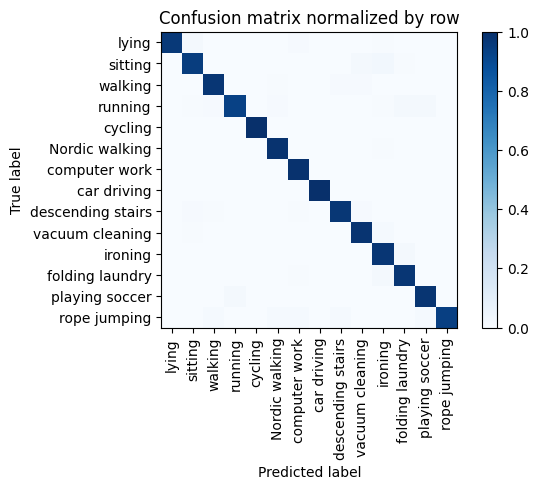

Training Epoch:  60%|██████    | 9/15 [06:50<04:36, 46.08s/it]

Overall accuracy: 0.974

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.988      0.988      0.145        603|	 folding laundry: 0.003,	sitting: 0.003,	
          ironing       0.948      0.974      0.961      0.112        466|	 folding laundry: 0.021,	vacuum cleaning: 0.002,	
          walking       0.989      0.974      0.981      0.111        461|	 vacuum cleaning: 0.011,	descending stairs: 0.009,	
          sitting       0.961      0.946      0.954      0.094        391|	 ironing: 0.028,	vacuum cleaning: 0.020,	
            lying       1.000      0.963      0.981      0.091        379|	 sitting: 0.016,	computer work: 0.011,	
   Nordic walking       0.983      0.986      0.985      0.086        356|	 ironing: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.947      0.982      0.964      0.079        329|	 ironing: 0.012,	sitting: 0.006,	
          cycling       1.000      1.000      1.000    


train: 100%|██████████| 261/261 [00:42<00:00,  6.09batch/s, loss=10.3, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:03<00:00, 16.34batch/s, loss=9.29]


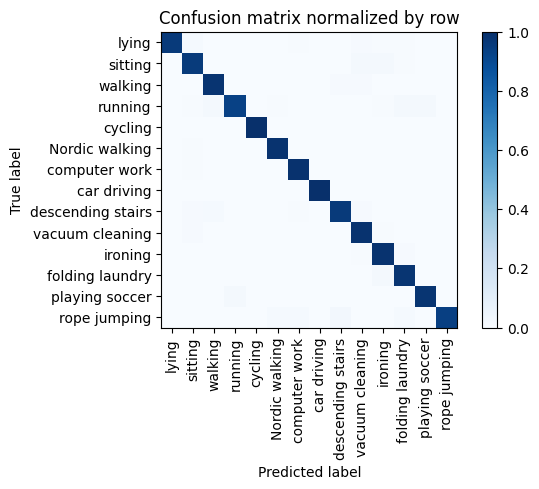

Training Epoch:  67%|██████▋   | 10/15 [07:37<03:52, 46.45s/it]

Overall accuracy: 0.977

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.990      0.992      0.144        601|	 sitting: 0.005,	folding laundry: 0.003,	
          ironing       0.964      0.985      0.974      0.112        464|	 folding laundry: 0.009,	vacuum cleaning: 0.004,	
          walking       0.983      0.980      0.982      0.111        461|	 vacuum cleaning: 0.009,	descending stairs: 0.009,	
          sitting       0.956      0.954      0.955      0.094        390|	 vacuum cleaning: 0.021,	ironing: 0.018,	
            lying       1.000      0.960      0.980      0.091        378|	 sitting: 0.013,	vacuum cleaning: 0.008,	
   Nordic walking       0.992      0.986      0.989      0.086        357|	 sitting: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.942      0.985      0.963      0.079        329|	 sitting: 0.009,	ironing: 0.006,	
          cycling       1.000      1.000      1.000  


train: 100%|██████████| 261/261 [00:43<00:00,  6.05batch/s, loss=9.59, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.33batch/s, loss=9.84]


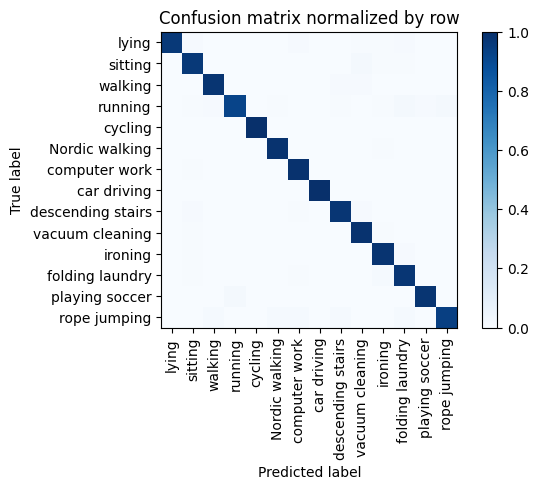

Training Epoch:  73%|███████▎  | 11/15 [08:25<03:07, 46.87s/it]

Overall accuracy: 0.977

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.990      0.990      0.145        604|	 sitting: 0.005,	folding laundry: 0.003,	
          ironing       0.972      0.983      0.978      0.112        465|	 folding laundry: 0.011,	sitting: 0.004,	
          walking       0.989      0.978      0.984      0.111        463|	 vacuum cleaning: 0.011,	descending stairs: 0.009,	
          sitting       0.961      0.964      0.962      0.093        386|	 vacuum cleaning: 0.021,	ironing: 0.008,	
            lying       1.000      0.963      0.981      0.092        382|	 folding laundry: 0.010,	computer work: 0.008,	
   Nordic walking       0.992      0.986      0.989      0.086        358|	 ironing: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.945      0.985      0.964      0.079        329|	 ironing: 0.006,	sitting: 0.006,	
          cycling       1.000      1.000      1.000    


train: 100%|██████████| 261/261 [00:42<00:00,  6.17batch/s, loss=10.1, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.85batch/s, loss=10.2]


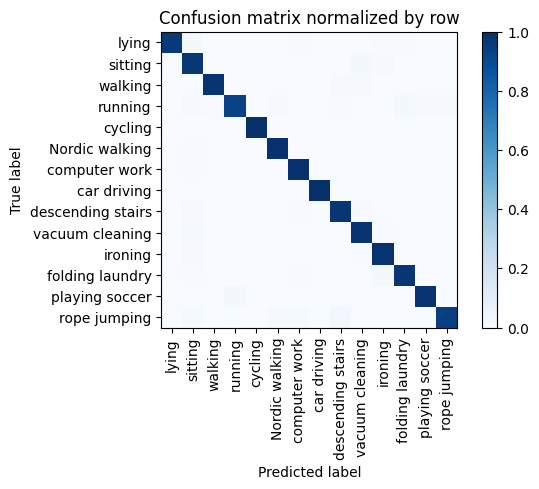

Training Epoch:  80%|████████  | 12/15 [09:12<02:20, 46.86s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.992      0.992      0.145        603|	 sitting: 0.007,	vacuum cleaning: 0.002,	
          walking       0.998      0.978      0.988      0.112        465|	 descending stairs: 0.011,	vacuum cleaning: 0.009,	
          ironing       0.974      0.985      0.980      0.111        463|	 sitting: 0.009,	vacuum cleaning: 0.004,	
          sitting       0.933      0.969      0.951      0.094        390|	 vacuum cleaning: 0.018,	ironing: 0.010,	
            lying       1.000      0.963      0.981      0.092        381|	 sitting: 0.018,	folding laundry: 0.005,	
   Nordic walking       0.989      0.989      0.989      0.085        354|	 sitting: 0.006,	folding laundry: 0.003,	
  vacuum cleaning       0.950      0.982      0.966      0.080        332|	 sitting: 0.012,	ironing: 0.006,	
          cycling       1.000      1.000      1.000      0.07


train: 100%|██████████| 261/261 [00:47<00:00,  5.55batch/s, loss=9.95, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.28batch/s, loss=10.2]


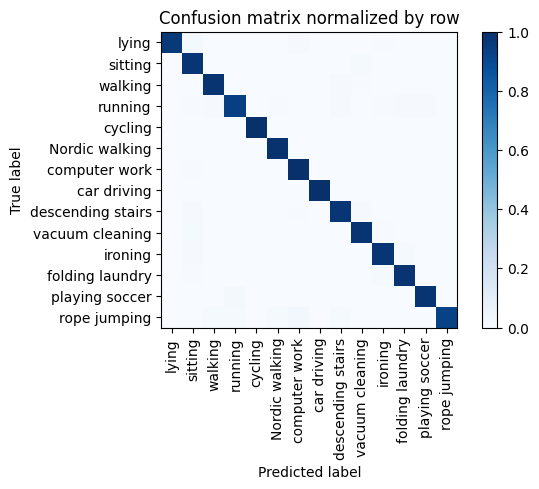

Training Epoch:  87%|████████▋ | 13/15 [10:03<01:36, 48.33s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.993      0.990      0.145        604|	 sitting: 0.005,	vacuum cleaning: 0.002,	
          ironing       0.978      0.974      0.976      0.111        463|	 folding laundry: 0.015,	sitting: 0.009,	
          walking       0.991      0.978      0.985      0.111        462|	 descending stairs: 0.011,	vacuum cleaning: 0.006,	
          sitting       0.941      0.974      0.957      0.094        392|	 vacuum cleaning: 0.015,	folding laundry: 0.003,	
            lying       1.000      0.963      0.981      0.091        380|	 sitting: 0.016,	computer work: 0.011,	
   Nordic walking       0.992      0.989      0.990      0.086        356|	 folding laundry: 0.003,	ironing: 0.003,	
  vacuum cleaning       0.958      0.979      0.968      0.079        329|	 sitting: 0.015,	ironing: 0.006,	
          cycling       1.000      1.000      1.000    


train: 100%|██████████| 261/261 [00:44<00:00,  5.83batch/s, loss=9.56, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.22batch/s, loss=8.89]


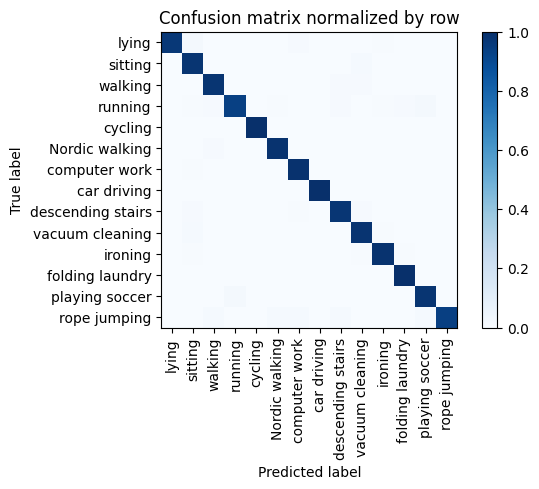

Training Epoch:  93%|█████████▎| 14/15 [10:53<00:48, 48.67s/it]

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.992      0.991      0.145        602|	 sitting: 0.005,	folding laundry: 0.002,	
          ironing       0.987      0.985      0.986      0.111        463|	 folding laundry: 0.004,	vacuum cleaning: 0.004,	
          walking       0.987      0.978      0.983      0.111        462|	 vacuum cleaning: 0.011,	descending stairs: 0.009,	
          sitting       0.953      0.977      0.965      0.094        391|	 vacuum cleaning: 0.015,	folding laundry: 0.003,	
            lying       1.000      0.966      0.983      0.092        382|	 sitting: 0.016,	computer work: 0.008,	
   Nordic walking       0.992      0.986      0.989      0.086        356|	 walking: 0.008,	folding laundry: 0.003,	
  vacuum cleaning       0.950      0.982      0.966      0.079        330|	 sitting: 0.012,	ironing: 0.006,	
          cycling       1.000      1.000      1


train: 100%|██████████| 261/261 [00:45<00:00,  5.76batch/s, loss=10.5, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.40batch/s, loss=8.92]


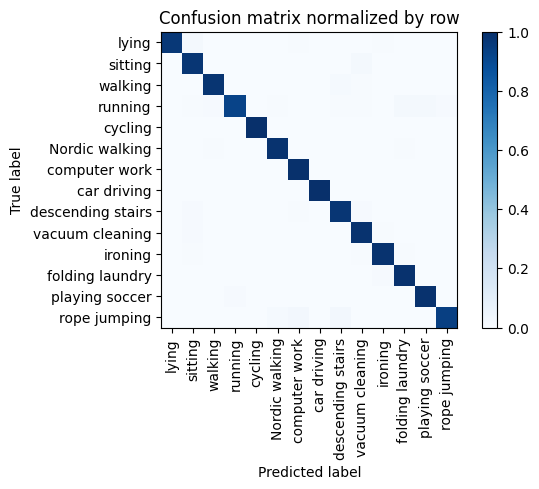

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.993      0.993      0.145        602|	 sitting: 0.003,	ironing: 0.002,	
          ironing       0.983      0.985      0.984      0.112        465|	 sitting: 0.006,	folding laundry: 0.004,	
          walking       0.991      0.978      0.985      0.112        464|	 descending stairs: 0.013,	vacuum cleaning: 0.006,	
          sitting       0.953      0.974      0.963      0.094        391|	 vacuum cleaning: 0.018,	folding laundry: 0.003,	
            lying       1.000      0.966      0.983      0.091        380|	 sitting: 0.018,	ironing: 0.005,	
   Nordic walking       0.992      0.986      0.989      0.086        356|	 folding laundry: 0.006,	walking: 0.006,	
  vacuum cleaning       0.950      0.985      0.967      0.079        329|	 sitting: 0.009,	ironing: 0.006,	
          cycling       1.000      1.000      1.000      0.072       

torch.Size([4, 2048])


unseen: 100%|██████████| 87/87 [00:05<00:00, 15.83batch/s, loss=10.8]


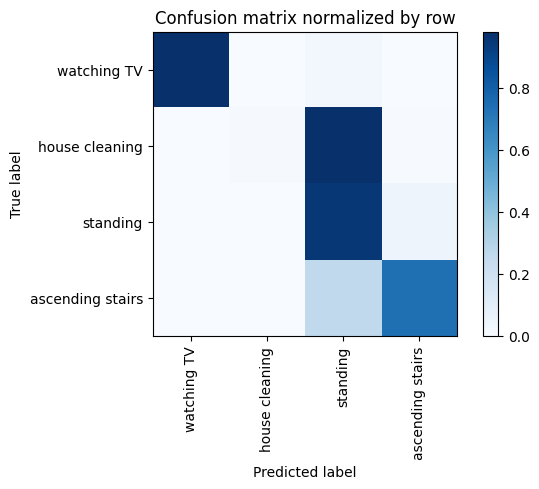

Overall accuracy: 0.606

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.457      0.952      0.617      0.331       1845|	 ascending stairs: 0.048,	house cleaning: 0.000,	
  house cleaning       1.000      0.010      0.021      0.328       1826|	 standing: 0.981,	ascending stairs: 0.007,	
ascending stairs       0.886      0.740      0.807      0.193       1073|	 standing: 0.260,	house cleaning: 0.000,	
     watching TV       0.996      0.976      0.986      0.148        824|	 standing: 0.024,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.797      0.606      0.513        1.0       5568|	      

{'accuracy': 0.6057830459770115, 'precision': 0.8347553763243202, 'recall': 0.6694690727548017, 'f1': 0.6075274830739513}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 'sitting', 'des

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16]
unseen classes >  [3, 17, 1, 11]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 262/262 [00:43<00:00,  6.08batch/s, loss=11.2, accuracy=0.891]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 16.07batch/s, loss=10.2]


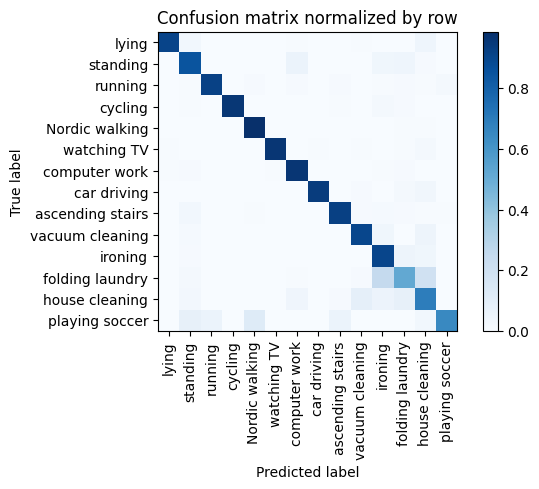

Training Epoch:   7%|▋         | 1/15 [00:47<11:05, 47.56s/it]

Overall accuracy: 0.884

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.933      0.961      0.947      0.142        591|	 folding laundry: 0.010,	standing: 0.010,	
         ironing       0.810      0.904      0.854      0.115        480|	 folding laundry: 0.050,	house cleaning: 0.035,	
           lying       0.986      0.908      0.945      0.094        390|	 house cleaning: 0.046,	standing: 0.028,	
  Nordic walking       0.959      0.987      0.972      0.090        376|	 house cleaning: 0.005,	folding laundry: 0.005,	
        standing       0.844      0.851      0.847      0.087        362|	 computer work: 0.058,	folding laundry: 0.044,	
  house cleaning       0.697      0.693      0.695      0.081        339|	 vacuum cleaning: 0.088,	folding laundry: 0.080,	
 vacuum cleaning       0.880      0.899      0.890      0.081        336|	 house cleaning: 0.048,	ironing: 0.036,	
         cycling       0.997      0.957    


train: 100%|██████████| 262/262 [00:46<00:00,  5.63batch/s, loss=10.8, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.62batch/s, loss=10.2]


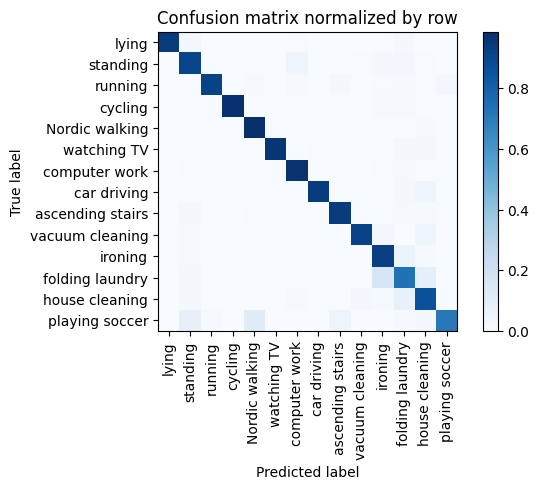

Training Epoch:  13%|█▎        | 2/15 [01:39<10:50, 50.03s/it]

Overall accuracy: 0.924

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.962      0.973      0.967      0.142        591|	 folding laundry: 0.008,	standing: 0.007,	
         ironing       0.890      0.923      0.906      0.116        481|	 folding laundry: 0.058,	standing: 0.010,	
           lying       0.995      0.943      0.968      0.093        388|	 standing: 0.028,	folding laundry: 0.015,	
  Nordic walking       0.961      0.987      0.974      0.091        377|	 house cleaning: 0.011,	ironing: 0.003,	
        standing       0.872      0.906      0.888      0.087        360|	 computer work: 0.039,	folding laundry: 0.025,	
 vacuum cleaning       0.963      0.914      0.938      0.081        338|	 house cleaning: 0.041,	ironing: 0.027,	
  house cleaning       0.834      0.856      0.845      0.080        334|	 folding laundry: 0.072,	vacuum cleaning: 0.024,	
         cycling       0.997      0.975      0.986      


train: 100%|██████████| 262/262 [00:45<00:00,  5.80batch/s, loss=11.1, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.67batch/s, loss=9.7] 


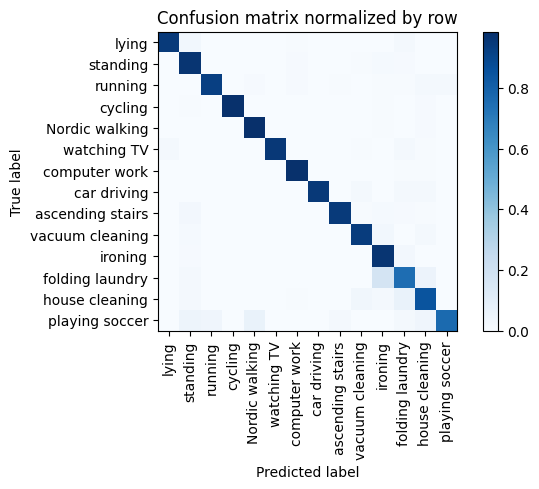

Training Epoch:  20%|██        | 3/15 [02:29<09:59, 49.96s/it]

Overall accuracy: 0.938

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.985      0.978      0.981      0.143        596|	 folding laundry: 0.007,	house cleaning: 0.005,	
         ironing       0.882      0.965      0.922      0.116        481|	 folding laundry: 0.025,	standing: 0.008,	
           lying       0.992      0.943      0.967      0.093        385|	 standing: 0.029,	folding laundry: 0.018,	
  Nordic walking       0.976      0.984      0.980      0.090        376|	 house cleaning: 0.008,	ironing: 0.005,	
        standing       0.889      0.961      0.924      0.086        359|	 ironing: 0.014,	folding laundry: 0.008,	
  house cleaning       0.877      0.848      0.862      0.081        336|	 folding laundry: 0.068,	vacuum cleaning: 0.033,	
 vacuum cleaning       0.946      0.935      0.940      0.081        336|	 ironing: 0.030,	house cleaning: 0.021,	
         cycling       0.991      0.978      0.984      


train: 100%|██████████| 262/262 [00:46<00:00,  5.62batch/s, loss=9.85, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.68batch/s, loss=9.73]


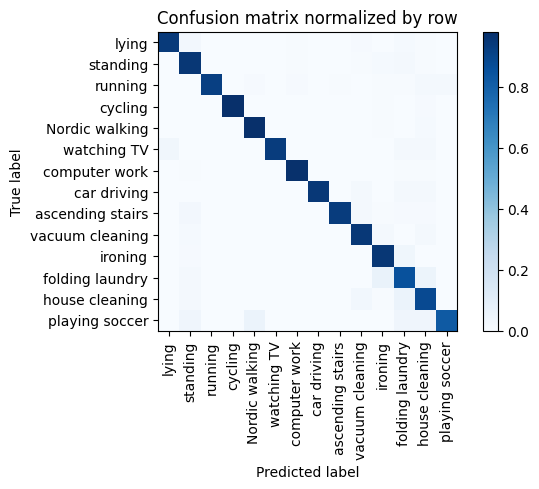

Training Epoch:  27%|██▋       | 4/15 [03:20<09:16, 50.62s/it]

Overall accuracy: 0.944

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.976      0.982      0.143        595|	 folding laundry: 0.007,	house cleaning: 0.005,	
         ironing       0.933      0.954      0.943      0.116        481|	 folding laundry: 0.037,	standing: 0.008,	
           lying       0.978      0.943      0.960      0.093        385|	 standing: 0.026,	folding laundry: 0.013,	
  Nordic walking       0.979      0.981      0.980      0.090        376|	 house cleaning: 0.013,	ironing: 0.005,	
        standing       0.894      0.953      0.923      0.087        363|	 folding laundry: 0.017,	ironing: 0.014,	
  house cleaning       0.872      0.885      0.878      0.081        339|	 folding laundry: 0.059,	vacuum cleaning: 0.029,	
 vacuum cleaning       0.938      0.949      0.943      0.080        334|	 house cleaning: 0.018,	ironing: 0.018,	
         cycling       1.000      0.978      0.989      


train: 100%|██████████| 262/262 [00:43<00:00,  5.97batch/s, loss=9.6, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.76batch/s, loss=10]  


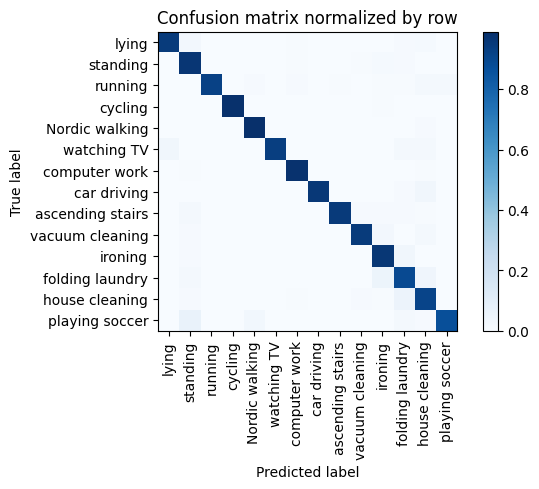

Training Epoch:  33%|███▎      | 5/15 [04:09<08:19, 49.93s/it]

Overall accuracy: 0.952

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.985      0.981      0.983      0.142        592|	 house cleaning: 0.007,	standing: 0.005,	
         ironing       0.933      0.959      0.946      0.116        482|	 folding laundry: 0.033,	standing: 0.008,	
           lying       0.979      0.946      0.962      0.093        388|	 standing: 0.023,	house cleaning: 0.013,	
  Nordic walking       0.987      0.989      0.988      0.090        375|	 house cleaning: 0.008,	ironing: 0.003,	
        standing       0.906      0.964      0.934      0.087        361|	 ironing: 0.014,	folding laundry: 0.008,	
  house cleaning       0.885      0.909      0.897      0.081        339|	 folding laundry: 0.056,	vacuum cleaning: 0.009,	
 vacuum cleaning       0.975      0.943      0.959      0.081        336|	 ironing: 0.027,	house cleaning: 0.021,	
         cycling       0.997      0.984      0.991      0.077   


train: 100%|██████████| 262/262 [00:46<00:00,  5.67batch/s, loss=9.47, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.83batch/s, loss=9.98]


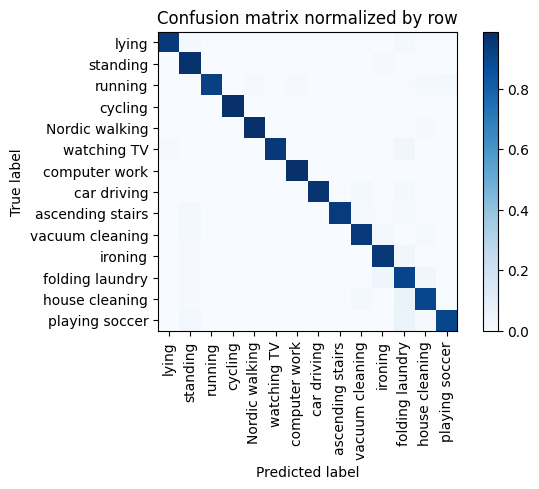

Training Epoch:  40%|████      | 6/15 [05:00<07:32, 50.30s/it]

Overall accuracy: 0.957

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.992      0.988      0.990      0.143        594|	 house cleaning: 0.003,	ironing: 0.003,	
         ironing       0.948      0.956      0.952      0.115        477|	 folding laundry: 0.036,	standing: 0.008,	
           lying       0.995      0.951      0.972      0.093        386|	 standing: 0.021,	folding laundry: 0.018,	
  Nordic walking       0.995      0.987      0.991      0.091        378|	 house cleaning: 0.008,	folding laundry: 0.003,	
        standing       0.912      0.978      0.944      0.087        360|	 ironing: 0.011,	house cleaning: 0.006,	
  house cleaning       0.930      0.900      0.915      0.081        339|	 folding laundry: 0.062,	vacuum cleaning: 0.021,	
 vacuum cleaning       0.955      0.946      0.951      0.081        336|	 ironing: 0.024,	standing: 0.018,	
         cycling       0.997      0.988      0.992      0.078  


train: 100%|██████████| 262/262 [00:45<00:00,  5.73batch/s, loss=9.65, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.27batch/s, loss=9.88]


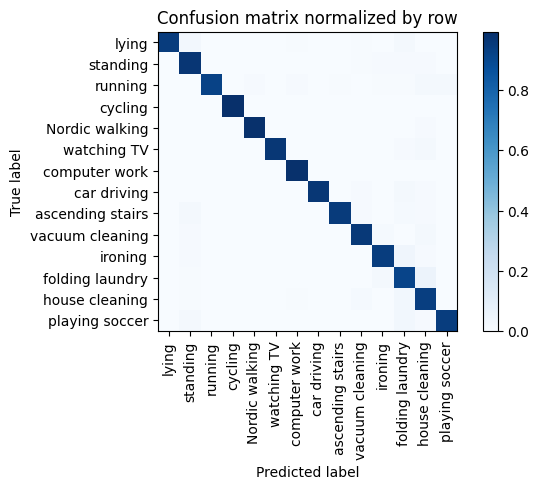

Training Epoch:  47%|████▋     | 7/15 [05:51<06:43, 50.46s/it]

Overall accuracy: 0.960

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.990      0.988      0.989      0.143        594|	 house cleaning: 0.003,	ironing: 0.003,	
         ironing       0.962      0.939      0.950      0.115        479|	 folding laundry: 0.042,	house cleaning: 0.008,	
           lying       1.000      0.943      0.971      0.094        389|	 standing: 0.026,	folding laundry: 0.018,	
  Nordic walking       0.995      0.989      0.992      0.090        376|	 house cleaning: 0.008,	standing: 0.003,	
        standing       0.923      0.967      0.944      0.087        360|	 ironing: 0.011,	house cleaning: 0.008,	
  house cleaning       0.886      0.938      0.911      0.081        339|	 folding laundry: 0.029,	vacuum cleaning: 0.015,	
 vacuum cleaning       0.961      0.955      0.958      0.081        337|	 house cleaning: 0.021,	ironing: 0.015,	
         cycling       1.000      0.994      0.997      0.


train: 100%|██████████| 262/262 [00:45<00:00,  5.76batch/s, loss=9.68, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.20batch/s, loss=9.56]


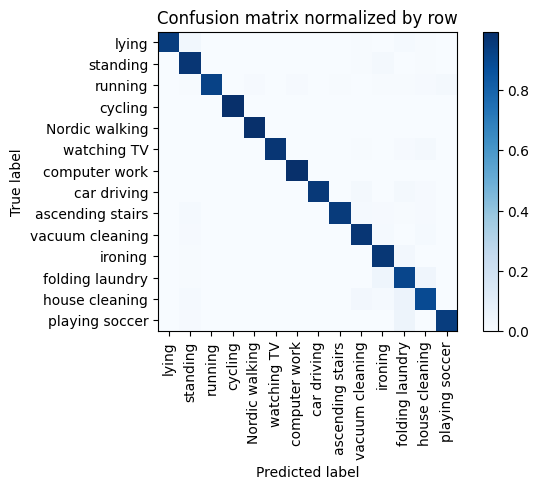

Training Epoch:  53%|█████▎    | 8/15 [06:41<05:52, 50.37s/it]

Overall accuracy: 0.960

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.993      0.994      0.142        592|	 ironing: 0.003,	house cleaning: 0.002,	
         ironing       0.941      0.965      0.953      0.115        480|	 folding laundry: 0.025,	standing: 0.006,	
           lying       1.000      0.943      0.971      0.093        387|	 standing: 0.028,	folding laundry: 0.013,	
  Nordic walking       0.995      0.992      0.993      0.091        377|	 house cleaning: 0.003,	folding laundry: 0.003,	
        standing       0.926      0.967      0.946      0.087        362|	 ironing: 0.019,	house cleaning: 0.006,	
 vacuum cleaning       0.945      0.967      0.956      0.081        336|	 house cleaning: 0.012,	ironing: 0.012,	
  house cleaning       0.917      0.893      0.905      0.081        335|	 folding laundry: 0.057,	vacuum cleaning: 0.024,	
         cycling       1.000      0.994      0.997      0


train: 100%|██████████| 262/262 [00:45<00:00,  5.71batch/s, loss=10.1, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.03batch/s, loss=8.88]


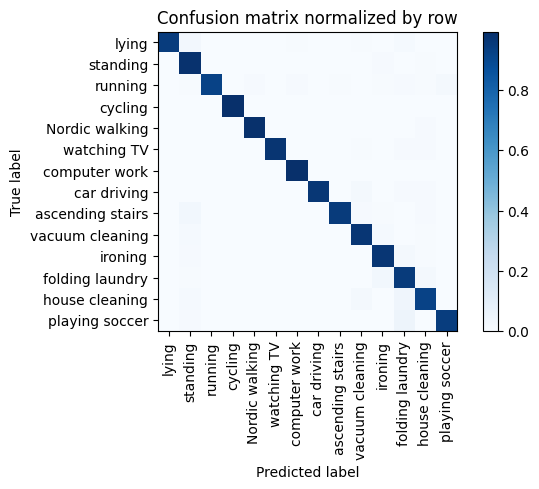

Training Epoch:  60%|██████    | 9/15 [07:33<05:04, 50.79s/it]

Overall accuracy: 0.967

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.992      0.993      0.992      0.143        594|	 ironing: 0.003,	house cleaning: 0.002,	
         ironing       0.961      0.969      0.965      0.115        480|	 folding laundry: 0.019,	standing: 0.008,	
           lying       1.000      0.946      0.972      0.093        388|	 standing: 0.026,	folding laundry: 0.013,	
  Nordic walking       0.995      0.987      0.991      0.090        375|	 house cleaning: 0.011,	standing: 0.003,	
        standing       0.917      0.983      0.949      0.087        361|	 ironing: 0.008,	house cleaning: 0.006,	
  house cleaning       0.937      0.924      0.930      0.082        340|	 folding laundry: 0.041,	vacuum cleaning: 0.018,	
 vacuum cleaning       0.958      0.967      0.963      0.080        333|	 ironing: 0.015,	standing: 0.012,	
         cycling       1.000      0.994      0.997      0.078        3


train: 100%|██████████| 262/262 [00:46<00:00,  5.67batch/s, loss=9.2, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.34batch/s, loss=8.69]


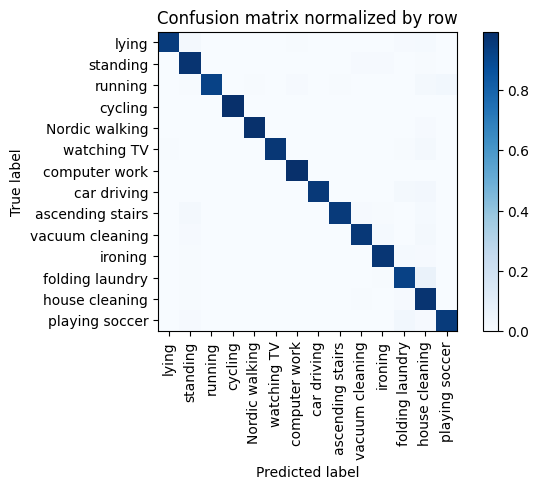

Training Epoch:  67%|██████▋   | 10/15 [08:24<04:15, 51.01s/it]

Overall accuracy: 0.969

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.993      0.993      0.143        593|	 house cleaning: 0.003,	ironing: 0.003,	
         ironing       0.975      0.969      0.972      0.116        481|	 folding laundry: 0.015,	house cleaning: 0.008,	
           lying       0.997      0.946      0.971      0.094        389|	 standing: 0.023,	house cleaning: 0.015,	
  Nordic walking       0.997      0.987      0.992      0.090        376|	 house cleaning: 0.011,	standing: 0.003,	
        standing       0.934      0.978      0.955      0.087        360|	 ironing: 0.008,	vacuum cleaning: 0.008,	
  house cleaning       0.866      0.976      0.918      0.081        337|	 folding laundry: 0.009,	vacuum cleaning: 0.006,	
 vacuum cleaning       0.976      0.961      0.969      0.081        337|	 house cleaning: 0.018,	ironing: 0.012,	
         cycling       1.000      0.994      0.997      0.


train: 100%|██████████| 262/262 [00:45<00:00,  5.76batch/s, loss=9.47, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.95batch/s, loss=9.24]


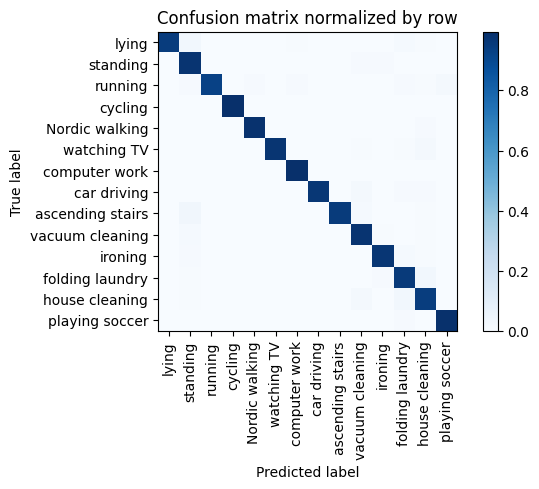

Training Epoch:  73%|███████▎  | 11/15 [09:14<03:23, 50.77s/it]

Overall accuracy: 0.970

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.992      0.995      0.993      0.143        593|	 ironing: 0.003,	house cleaning: 0.002,	
         ironing       0.975      0.971      0.973      0.115        480|	 folding laundry: 0.013,	standing: 0.008,	
           lying       1.000      0.946      0.972      0.093        387|	 standing: 0.028,	folding laundry: 0.013,	
  Nordic walking       0.995      0.987      0.991      0.091        377|	 house cleaning: 0.011,	standing: 0.003,	
        standing       0.917      0.978      0.947      0.087        362|	 ironing: 0.011,	vacuum cleaning: 0.008,	
  house cleaning       0.930      0.941      0.935      0.081        338|	 folding laundry: 0.030,	vacuum cleaning: 0.018,	
 vacuum cleaning       0.951      0.976      0.963      0.081        336|	 standing: 0.012,	house cleaning: 0.006,	
         cycling       1.000      0.994      0.997      0.077 


train: 100%|██████████| 262/262 [00:49<00:00,  5.30batch/s, loss=10.2, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.19batch/s, loss=9.38]


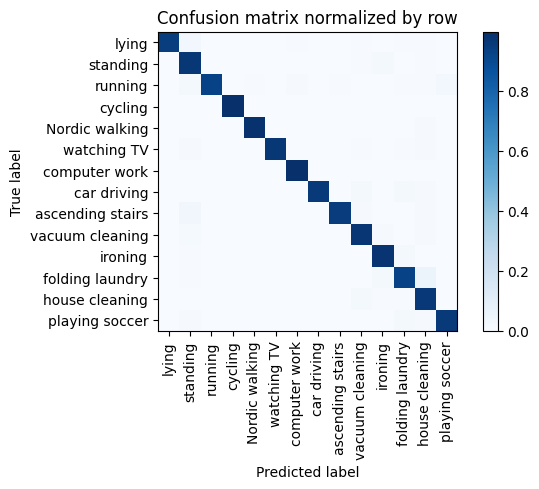

Training Epoch:  80%|████████  | 12/15 [10:09<02:35, 51.90s/it]

Overall accuracy: 0.969

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.995      0.994      0.142        592|	 ironing: 0.003,	house cleaning: 0.002,	
         ironing       0.965      0.975      0.970      0.116        482|	 folding laundry: 0.017,	standing: 0.004,	
           lying       1.000      0.946      0.972      0.093        386|	 standing: 0.031,	folding laundry: 0.008,	
  Nordic walking       0.997      0.987      0.992      0.091        380|	 house cleaning: 0.011,	standing: 0.003,	
        standing       0.911      0.969      0.939      0.086        358|	 ironing: 0.017,	house cleaning: 0.006,	
  house cleaning       0.919      0.965      0.941      0.082        340|	 vacuum cleaning: 0.018,	folding laundry: 0.006,	
 vacuum cleaning       0.953      0.970      0.962      0.081        338|	 standing: 0.012,	house cleaning: 0.009,	
         cycling       1.000      0.997      0.998      0.077  


train: 100%|██████████| 262/262 [00:46<00:00,  5.69batch/s, loss=9.38, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.13batch/s, loss=9.69]


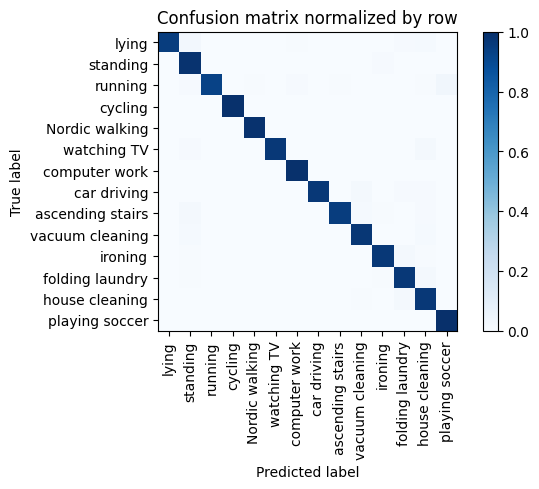

Training Epoch:  87%|████████▋ | 13/15 [11:00<01:43, 51.58s/it]

Overall accuracy: 0.973

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.993      0.993      0.141        588|	 ironing: 0.003,	house cleaning: 0.002,	
         ironing       0.979      0.967      0.973      0.115        478|	 folding laundry: 0.021,	house cleaning: 0.006,	
           lying       1.000      0.946      0.972      0.094        389|	 standing: 0.026,	house cleaning: 0.013,	
  Nordic walking       0.997      0.992      0.995      0.090        376|	 house cleaning: 0.003,	folding laundry: 0.003,	
        standing       0.927      0.986      0.956      0.087        361|	 ironing: 0.008,	house cleaning: 0.003,	
  house cleaning       0.922      0.968      0.944      0.082        340|	 folding laundry: 0.021,	vacuum cleaning: 0.006,	
 vacuum cleaning       0.973      0.970      0.972      0.081        336|	 house cleaning: 0.015,	standing: 0.012,	
         cycling       1.000      0.994      0.997 


train: 100%|██████████| 262/262 [00:46<00:00,  5.63batch/s, loss=9.3, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.91batch/s, loss=9.14]


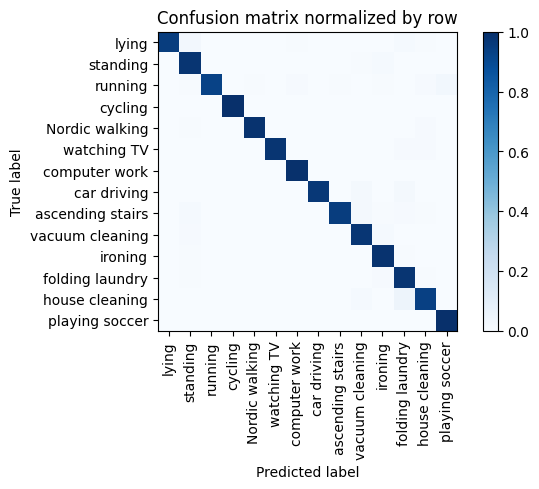

Training Epoch:  93%|█████████▎| 14/15 [11:52<00:51, 51.78s/it]

Overall accuracy: 0.974

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.992      0.995      0.993      0.143        595|	 ironing: 0.003,	house cleaning: 0.002,	
         ironing       0.967      0.987      0.977      0.115        478|	 folding laundry: 0.006,	standing: 0.004,	
           lying       1.000      0.946      0.972      0.093        387|	 standing: 0.026,	folding laundry: 0.013,	
  Nordic walking       0.997      0.987      0.992      0.091        378|	 house cleaning: 0.008,	standing: 0.005,	
        standing       0.939      0.978      0.958      0.087        360|	 ironing: 0.014,	vacuum cleaning: 0.006,	
  house cleaning       0.958      0.935      0.947      0.082        341|	 folding laundry: 0.047,	vacuum cleaning: 0.012,	
 vacuum cleaning       0.959      0.976      0.968      0.081        337|	 ironing: 0.012,	standing: 0.009,	
         cycling       1.000      1.000      1.000      0.077        


train: 100%|██████████| 262/262 [00:49<00:00,  5.29batch/s, loss=9.48, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.56batch/s, loss=8.91]


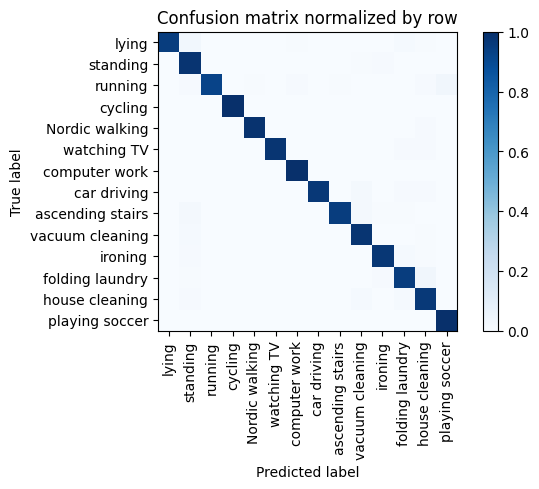

Overall accuracy: 0.973

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.997      0.995      0.143        594|	 ironing: 0.003,	playing soccer: 0.000,	
         ironing       0.981      0.971      0.976      0.115        479|	 folding laundry: 0.013,	standing: 0.008,	
           lying       1.000      0.946      0.972      0.093        386|	 standing: 0.028,	folding laundry: 0.013,	
  Nordic walking       0.997      0.987      0.992      0.091        378|	 house cleaning: 0.008,	folding laundry: 0.003,	
        standing       0.919      0.983      0.950      0.087        360|	 ironing: 0.008,	vacuum cleaning: 0.006,	
  house cleaning       0.936      0.961      0.949      0.081        337|	 folding laundry: 0.012,	vacuum cleaning: 0.012,	
 vacuum cleaning       0.959      0.979      0.969      0.081        337|	 standing: 0.012,	house cleaning: 0.006,	
         cycling       1.000      0.997      0.998     

unseen: 100%|██████████| 86/86 [00:05<00:00, 15.15batch/s, loss=11.5]


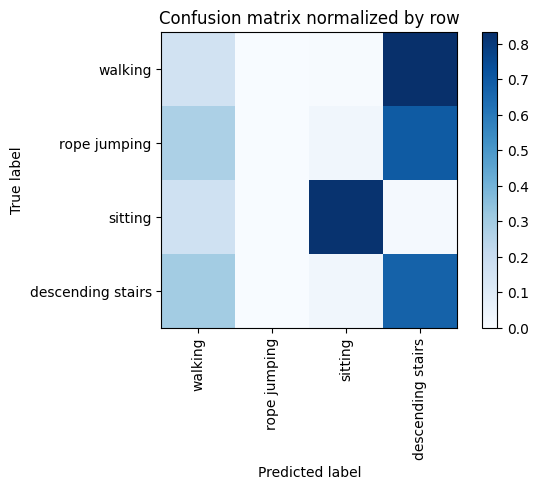

Overall accuracy: 0.449

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.344      0.159      0.218      0.422       2320|	 descending stairs: 0.834,	sitting: 0.006,	
          sitting       0.964      0.822      0.888      0.324       1784|	 walking: 0.166,	descending stairs: 0.011,	
descending stairs       0.218      0.672      0.330      0.172        945|	 walking: 0.299,	sitting: 0.029,	
     rope jumping       0.000      0.000      0.000      0.083        455|	 descending stairs: 0.697,	walking: 0.277,	sitting: 0.026,	

----------------------------------------------------------------------------------------------------
      avg / total       0.495      0.449      0.436        1.0       5504|	      

{'accuracy': 0.4491279069767442, 'precision': 0.38170036622945397, 'recall': 0.4134374619046801, 'f1': 0.3588370282891073}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuu

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 17]
unseen classes >  [16, 0, 12, 8]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 242/242 [00:40<00:00,  5.96batch/s, loss=11.6, accuracy=0.828]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.25batch/s, loss=11.7]


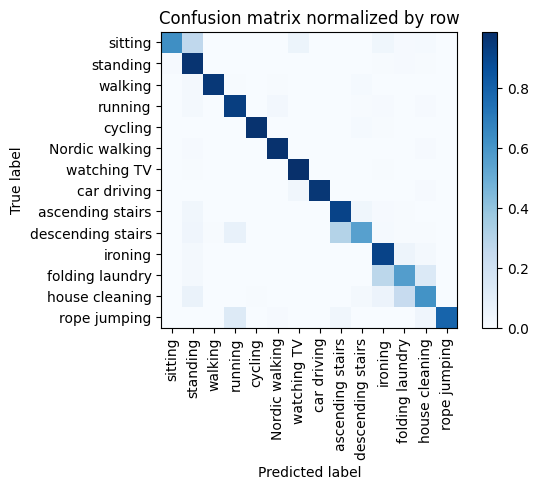

Training Epoch:   7%|▋         | 1/15 [00:45<10:33, 45.23s/it]

Overall accuracy: 0.845

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.804      0.912      0.855      0.121        464|	 folding laundry: 0.050,	standing: 0.022,	
          walking       0.993      0.955      0.973      0.115        440|	 standing: 0.016,	descending stairs: 0.014,	
   house cleaning       0.817      0.613      0.700      0.100        385|	 folding laundry: 0.242,	standing: 0.065,	
         standing       0.690      0.973      0.807      0.095        366|	 folding laundry: 0.008,	sitting: 0.008,	
   Nordic walking       0.975      0.978      0.977      0.095        365|	 house cleaning: 0.008,	standing: 0.008,	
          sitting       0.986      0.629      0.768      0.089        342|	 standing: 0.263,	watching TV: 0.053,	
          cycling       0.993      0.974      0.984      0.080        307|	 descending stairs: 0.013,	ironing: 0.007,	
 ascending stairs       0.749      0.914      0.823      0.


train: 100%|██████████| 242/242 [00:42<00:00,  5.71batch/s, loss=11.2, accuracy=0.891]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.51batch/s, loss=10.9]


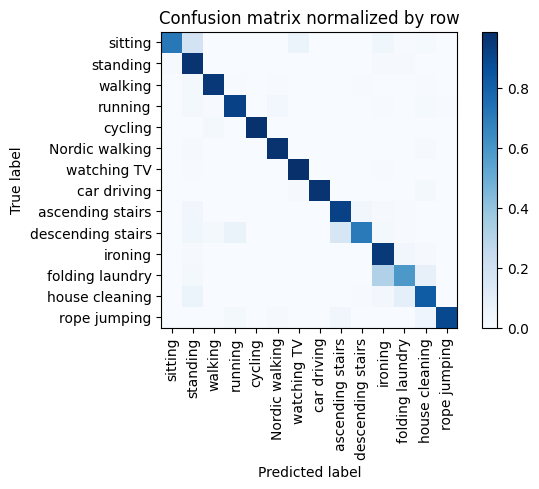

Training Epoch:  13%|█▎        | 2/15 [01:32<10:01, 46.26s/it]

Overall accuracy: 0.889

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.814      0.946      0.875      0.121        463|	 folding laundry: 0.032,	house cleaning: 0.011,	
          walking       0.975      0.957      0.966      0.115        440|	 standing: 0.016,	descending stairs: 0.007,	
   house cleaning       0.888      0.822      0.854      0.101        387|	 folding laundry: 0.085,	standing: 0.059,	
   Nordic walking       0.973      0.976      0.974      0.096        368|	 house cleaning: 0.011,	standing: 0.008,	
         standing       0.744      0.970      0.842      0.095        366|	 ironing: 0.011,	sitting: 0.011,	
          sitting       0.976      0.711      0.823      0.088        339|	 standing: 0.180,	watching TV: 0.053,	
          cycling       1.000      0.977      0.988      0.080        307|	 walking: 0.016,	ironing: 0.003,	
 ascending stairs       0.846      0.919      0.881      0.055        2


train: 100%|██████████| 242/242 [00:43<00:00,  5.50batch/s, loss=10.6, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.31batch/s, loss=11]


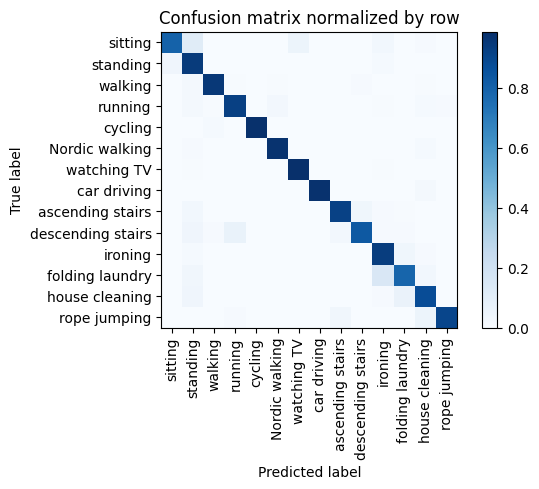

Training Epoch:  20%|██        | 3/15 [02:20<09:27, 47.32s/it]

Overall accuracy: 0.916

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.884      0.937      0.910      0.121        463|	 folding laundry: 0.037,	standing: 0.015,	
          walking       0.979      0.957      0.968      0.114        438|	 standing: 0.016,	descending stairs: 0.011,	
   house cleaning       0.918      0.878      0.897      0.100        384|	 folding laundry: 0.065,	standing: 0.042,	
   Nordic walking       0.981      0.973      0.977      0.096        367|	 house cleaning: 0.014,	standing: 0.008,	
         standing       0.779      0.943      0.853      0.095        366|	 sitting: 0.041,	ironing: 0.014,	
          sitting       0.937      0.796      0.861      0.088        338|	 standing: 0.112,	watching TV: 0.053,	
          cycling       1.000      0.981      0.990      0.080        309|	 walking: 0.013,	standing: 0.003,	
 ascending stairs       0.961      0.920      0.940      0.055        212|	 


train: 100%|██████████| 242/242 [00:44<00:00,  5.50batch/s, loss=10.6, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.59batch/s, loss=9.8]


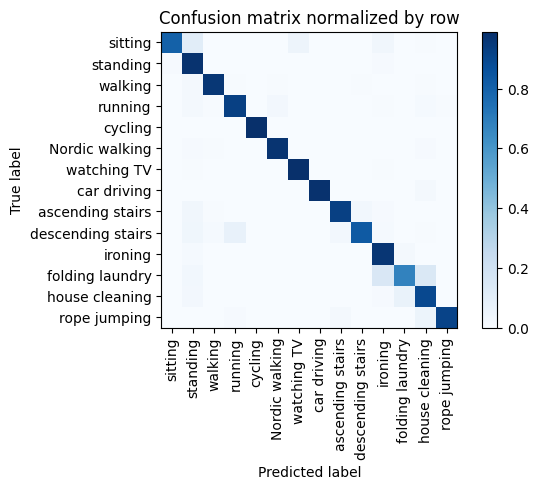

Training Epoch:  27%|██▋       | 4/15 [03:09<08:46, 47.84s/it]

Overall accuracy: 0.920

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.885      0.963      0.923      0.121        465|	 folding laundry: 0.022,	standing: 0.013,	
          walking       0.981      0.961      0.971      0.114        438|	 standing: 0.016,	house cleaning: 0.005,	
   house cleaning       0.873      0.896      0.884      0.100        384|	 folding laundry: 0.068,	standing: 0.026,	
   Nordic walking       0.981      0.973      0.977      0.095        366|	 house cleaning: 0.011,	standing: 0.008,	
         standing       0.801      0.975      0.880      0.095        363|	 ironing: 0.011,	sitting: 0.011,	
          sitting       0.975      0.802      0.880      0.089        343|	 standing: 0.108,	watching TV: 0.050,	
          cycling       1.000      0.990      0.995      0.079        304|	 ironing: 0.003,	walking: 0.003,	
 ascending stairs       0.961      0.925      0.942      0.055        212|	 stan


train: 100%|██████████| 242/242 [00:42<00:00,  5.65batch/s, loss=10.7, accuracy=0.875]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.90batch/s, loss=10]


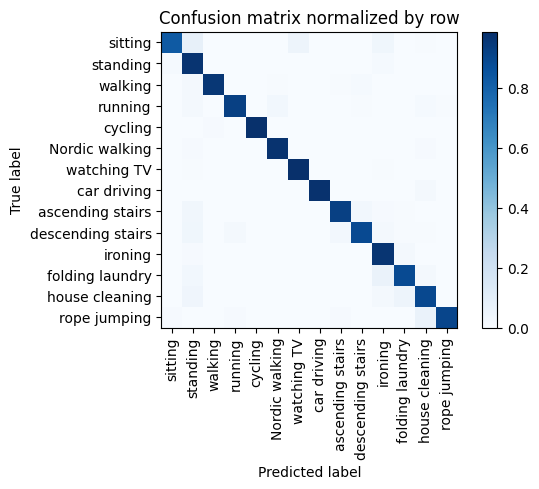

Training Epoch:  33%|███▎      | 5/15 [03:56<07:56, 47.63s/it]

Overall accuracy: 0.936

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.911      0.968      0.938      0.121        464|	 folding laundry: 0.019,	standing: 0.011,	
          walking       0.991      0.959      0.974      0.114        437|	 standing: 0.016,	descending stairs: 0.014,	
   house cleaning       0.940      0.894      0.916      0.101        386|	 folding laundry: 0.047,	standing: 0.041,	
   Nordic walking       0.978      0.976      0.977      0.096        368|	 house cleaning: 0.011,	standing: 0.008,	
         standing       0.810      0.973      0.884      0.095        364|	 ironing: 0.014,	sitting: 0.014,	
          sitting       0.969      0.829      0.894      0.089        340|	 standing: 0.079,	watching TV: 0.047,	
          cycling       1.000      0.984      0.992      0.080        309|	 walking: 0.010,	ironing: 0.003,	
 ascending stairs       0.961      0.925      0.942      0.055        212|	 s


train: 100%|██████████| 242/242 [00:41<00:00,  5.89batch/s, loss=10.7, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:03<00:00, 15.14batch/s, loss=10.9]


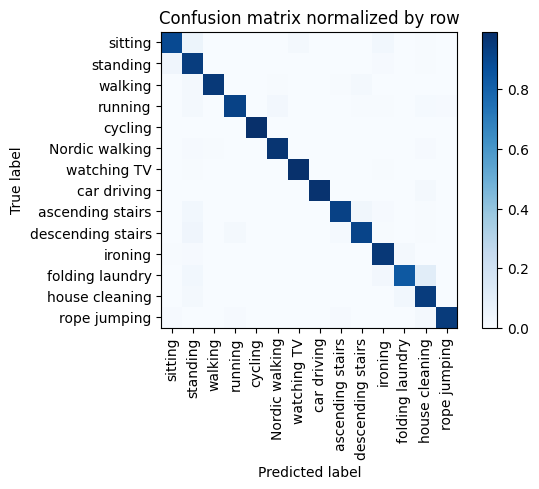

Training Epoch:  40%|████      | 6/15 [04:42<07:02, 46.90s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.945      0.961      0.953      0.121        464|	 folding laundry: 0.019,	standing: 0.011,	
          walking       0.993      0.957      0.974      0.114        437|	 descending stairs: 0.016,	standing: 0.016,	
   house cleaning       0.901      0.946      0.923      0.101        387|	 folding laundry: 0.028,	standing: 0.023,	
   Nordic walking       0.981      0.973      0.977      0.096        367|	 house cleaning: 0.011,	standing: 0.008,	
         standing       0.836      0.940      0.885      0.095        364|	 sitting: 0.041,	ironing: 0.011,	
          sitting       0.935      0.893      0.913      0.087        336|	 standing: 0.054,	ironing: 0.030,	
          cycling       1.000      0.994      0.997      0.081        310|	 walking: 0.003,	sitting: 0.003,	
 ascending stairs       0.970      0.924      0.947      0.055        211|	 desce


train: 100%|██████████| 242/242 [00:42<00:00,  5.65batch/s, loss=11, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:03<00:00, 15.06batch/s, loss=10.3]


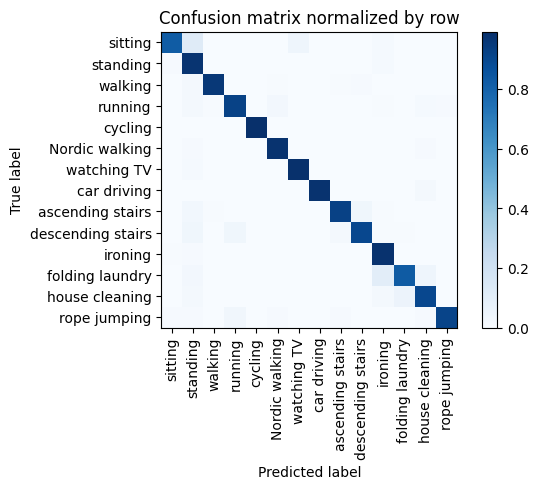

Training Epoch:  47%|████▋     | 7/15 [05:29<06:16, 47.04s/it]

Overall accuracy: 0.938

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.918      0.983      0.949      0.121        465|	 standing: 0.011,	sitting: 0.004,	
          walking       0.991      0.961      0.976      0.114        438|	 standing: 0.016,	descending stairs: 0.011,	
   house cleaning       0.951      0.904      0.927      0.100        385|	 folding laundry: 0.057,	standing: 0.021,	
   Nordic walking       0.978      0.978      0.978      0.096        370|	 standing: 0.011,	house cleaning: 0.008,	
         standing       0.797      0.978      0.878      0.094        361|	 ironing: 0.014,	sitting: 0.008,	
          sitting       0.979      0.824      0.895      0.089        341|	 standing: 0.117,	watching TV: 0.044,	
          cycling       1.000      0.993      0.997      0.080        307|	 walking: 0.003,	standing: 0.003,	
 ascending stairs       0.970      0.925      0.947      0.055        212|	 descendi


train: 100%|██████████| 242/242 [00:43<00:00,  5.62batch/s, loss=9.96, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.30batch/s, loss=10.2]


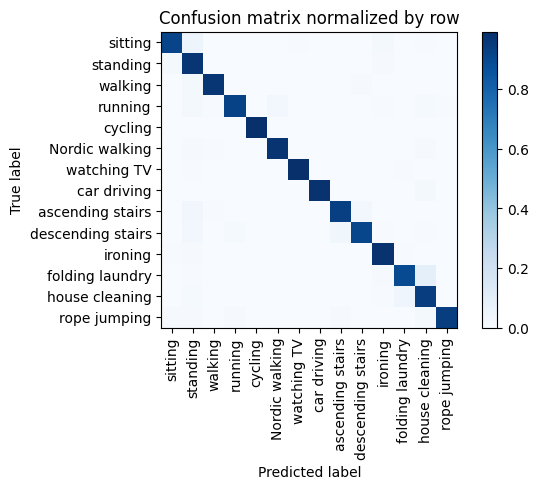

Training Epoch:  53%|█████▎    | 8/15 [06:17<05:30, 47.24s/it]

Overall accuracy: 0.953

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.958      0.981      0.969      0.121        463|	 standing: 0.009,	folding laundry: 0.004,	
          walking       0.991      0.968      0.979      0.114        436|	 standing: 0.016,	descending stairs: 0.009,	
   house cleaning       0.917      0.938      0.927      0.101        388|	 folding laundry: 0.041,	standing: 0.013,	
   Nordic walking       0.981      0.975      0.978      0.096        367|	 house cleaning: 0.008,	standing: 0.008,	
         standing       0.862      0.967      0.912      0.095        363|	 sitting: 0.022,	ironing: 0.011,	
          sitting       0.960      0.916      0.937      0.090        344|	 standing: 0.049,	ironing: 0.023,	
          cycling       1.000      0.993      0.997      0.080        307|	 ironing: 0.003,	sitting: 0.003,	
 ascending stairs       0.956      0.933      0.944      0.054        208|	 stand


train: 100%|██████████| 242/242 [00:44<00:00,  5.39batch/s, loss=10.9, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.59batch/s, loss=10.4]


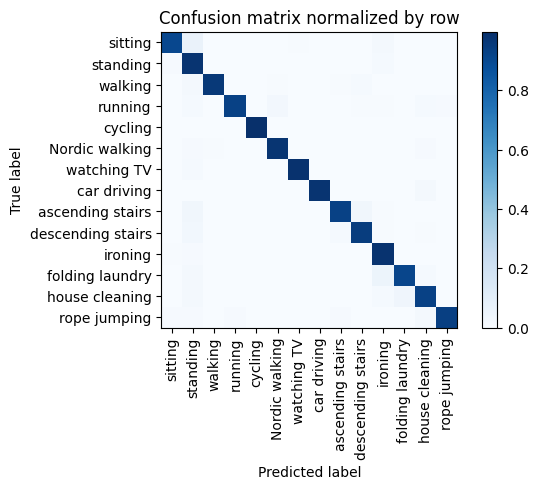

Training Epoch:  60%|██████    | 9/15 [07:06<04:48, 48.02s/it]

Overall accuracy: 0.955

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.936      0.983      0.959      0.120        462|	 standing: 0.011,	sitting: 0.004,	
          walking       0.995      0.959      0.977      0.114        436|	 standing: 0.016,	descending stairs: 0.014,	
   house cleaning       0.960      0.927      0.943      0.100        385|	 folding laundry: 0.042,	standing: 0.018,	
   Nordic walking       0.981      0.975      0.978      0.096        367|	 house cleaning: 0.008,	standing: 0.008,	
         standing       0.839      0.978      0.903      0.095        363|	 ironing: 0.014,	sitting: 0.008,	
          sitting       0.978      0.907      0.941      0.090        344|	 standing: 0.064,	ironing: 0.017,	
          cycling       1.000      0.997      0.998      0.080        307|	 standing: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.970      0.929      0.949      0.055        211|	 descend


train: 100%|██████████| 242/242 [00:43<00:00,  5.52batch/s, loss=10.2, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.95batch/s, loss=9.76]


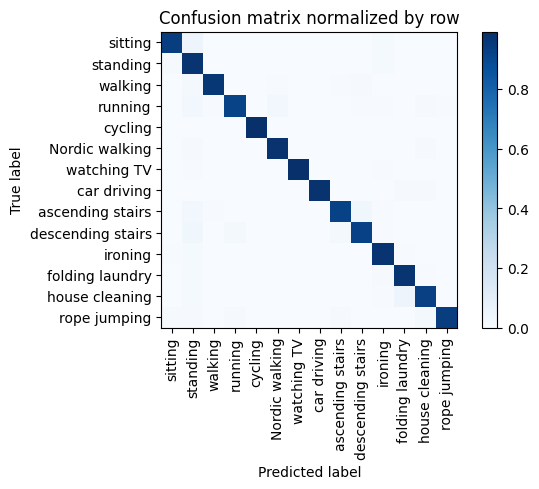

Training Epoch:  67%|██████▋   | 10/15 [07:55<04:00, 48.19s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.960      0.974      0.967      0.122        467|	 standing: 0.015,	folding laundry: 0.006,	
          walking       0.993      0.964      0.978      0.114        439|	 standing: 0.016,	descending stairs: 0.009,	
   house cleaning       0.976      0.930      0.952      0.101        387|	 folding laundry: 0.049,	standing: 0.016,	
   Nordic walking       0.978      0.978      0.978      0.095        365|	 house cleaning: 0.008,	standing: 0.008,	
         standing       0.847      0.978      0.907      0.094        361|	 ironing: 0.014,	sitting: 0.008,	
          sitting       0.979      0.936      0.957      0.089        342|	 standing: 0.050,	ironing: 0.015,	
          cycling       0.997      0.993      0.995      0.080        307|	 walking: 0.003,	standing: 0.003,	
 ascending stairs       0.970      0.923      0.946      0.054        209|	 desc


train: 100%|██████████| 242/242 [00:43<00:00,  5.56batch/s, loss=9.95, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.73batch/s, loss=10.5]


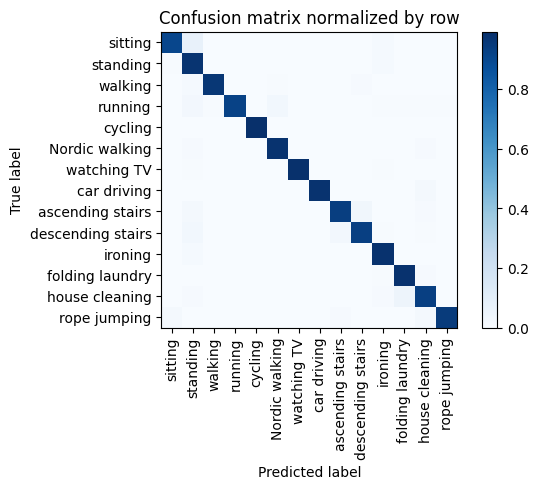

Training Epoch:  73%|███████▎  | 11/15 [08:43<03:12, 48.23s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.960      0.983      0.971      0.121        463|	 standing: 0.013,	folding laundry: 0.002,	
          walking       0.993      0.966      0.979      0.114        438|	 standing: 0.014,	descending stairs: 0.011,	
   house cleaning       0.957      0.933      0.945      0.101        386|	 folding laundry: 0.049,	ironing: 0.010,	
   Nordic walking       0.978      0.978      0.978      0.096        368|	 standing: 0.011,	house cleaning: 0.008,	
         standing       0.851      0.978      0.910      0.094        361|	 ironing: 0.014,	sitting: 0.006,	
          sitting       0.984      0.907      0.944      0.090        344|	 standing: 0.076,	ironing: 0.015,	
          cycling       1.000      0.994      0.997      0.080        308|	 walking: 0.003,	standing: 0.003,	
 ascending stairs       0.970      0.938      0.954      0.054        209|	 desce


train: 100%|██████████| 242/242 [00:42<00:00,  5.69batch/s, loss=9.75, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.67batch/s, loss=10]


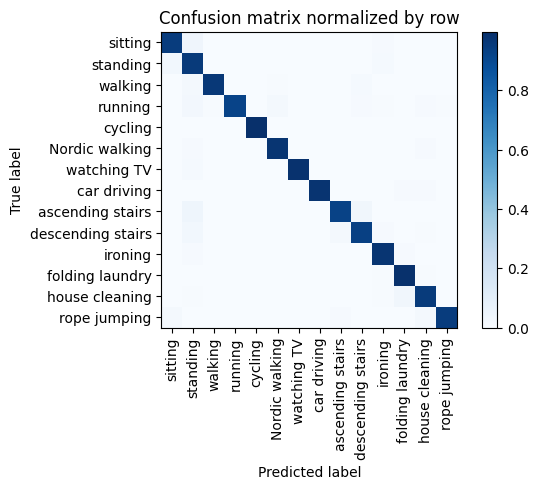

Training Epoch:  80%|████████  | 12/15 [09:31<02:23, 47.95s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.966      0.976      0.971      0.122        468|	 standing: 0.011,	folding laundry: 0.009,	
          walking       0.995      0.964      0.979      0.114        439|	 standing: 0.016,	descending stairs: 0.014,	
   house cleaning       0.969      0.953      0.961      0.101        387|	 folding laundry: 0.034,	standing: 0.008,	
   Nordic walking       0.984      0.975      0.979      0.096        367|	 house cleaning: 0.011,	standing: 0.008,	
         standing       0.864      0.956      0.907      0.095        364|	 sitting: 0.030,	ironing: 0.014,	
          sitting       0.956      0.948      0.952      0.089        343|	 standing: 0.041,	ironing: 0.012,	
          cycling       1.000      0.997      0.998      0.080        306|	 standing: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.975      0.924      0.949      0.055        210|	


train: 100%|██████████| 242/242 [00:46<00:00,  5.22batch/s, loss=10, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.14batch/s, loss=9.12]


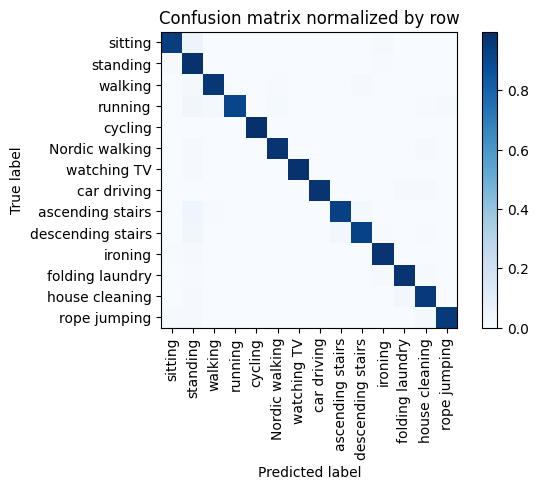

Training Epoch:  87%|████████▋ | 13/15 [10:22<01:37, 48.88s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.981      0.981      0.981      0.121        465|	 standing: 0.011,	sitting: 0.006,	
          walking       0.986      0.968      0.977      0.115        440|	 standing: 0.016,	descending stairs: 0.009,	
   house cleaning       0.974      0.956      0.965      0.101        386|	 folding laundry: 0.028,	standing: 0.016,	
   Nordic walking       0.986      0.978      0.982      0.095        366|	 house cleaning: 0.008,	standing: 0.008,	
         standing       0.846      0.986      0.911      0.094        362|	 sitting: 0.008,	ironing: 0.006,	
          sitting       0.976      0.944      0.960      0.089        340|	 standing: 0.047,	ironing: 0.009,	
          cycling       1.000      0.997      0.998      0.080        309|	 standing: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.970      0.933      0.951      0.055        210|	 standin


train: 100%|██████████| 242/242 [00:43<00:00,  5.58batch/s, loss=10.2, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 14.19batch/s, loss=9]


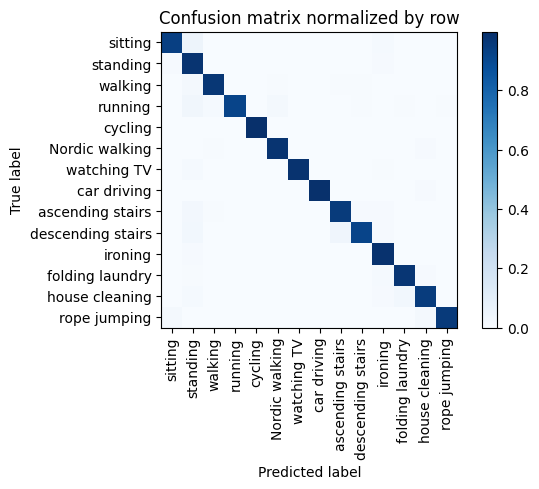

Training Epoch:  93%|█████████▎| 14/15 [11:10<00:48, 48.61s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.954      0.987      0.970      0.121        466|	 standing: 0.011,	folding laundry: 0.002,	
          walking       0.986      0.966      0.976      0.115        441|	 standing: 0.016,	descending stairs: 0.007,	
   house cleaning       0.979      0.949      0.963      0.101        389|	 folding laundry: 0.028,	standing: 0.013,	
   Nordic walking       0.984      0.978      0.981      0.096        367|	 house cleaning: 0.008,	walking: 0.005,	
         standing       0.862      0.981      0.918      0.095        364|	 ironing: 0.011,	sitting: 0.008,	
          sitting       0.982      0.936      0.958      0.089        343|	 standing: 0.050,	ironing: 0.015,	
          cycling       0.997      0.997      0.997      0.080        307|	 standing: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.952      0.952      0.952      0.054        208|	 


train: 100%|██████████| 242/242 [00:41<00:00,  5.78batch/s, loss=9.62, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:03<00:00, 15.04batch/s, loss=9.72]


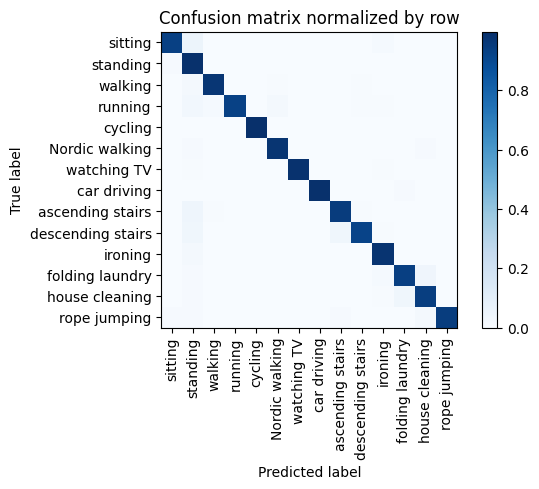

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.966      0.978      0.972      0.120        461|	 standing: 0.020,	folding laundry: 0.002,	
          walking       0.989      0.971      0.979      0.115        443|	 standing: 0.016,	descending stairs: 0.007,	
   house cleaning       0.963      0.941      0.952      0.102        390|	 folding laundry: 0.036,	standing: 0.010,	
   Nordic walking       0.984      0.976      0.980      0.096        369|	 house cleaning: 0.011,	standing: 0.008,	
         standing       0.841      0.989      0.909      0.095        364|	 sitting: 0.008,	ironing: 0.003,	
          sitting       0.981      0.933      0.956      0.089        341|	 standing: 0.053,	ironing: 0.015,	
          cycling       1.000      0.997      0.998      0.080        306|	 standing: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.961      0.948      0.954      0.055        210|	

unseen: 100%|██████████| 111/111 [00:06<00:00, 16.31batch/s, loss=13]  


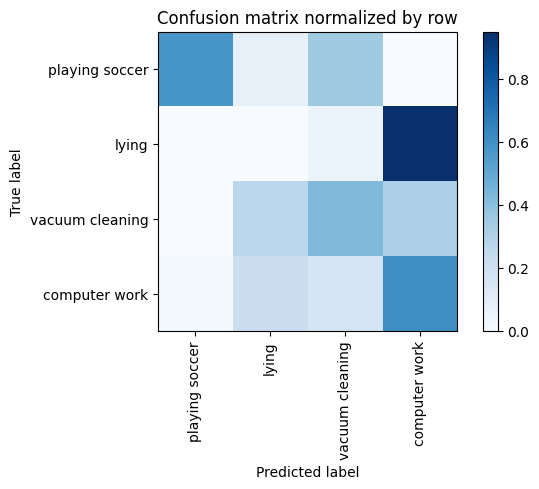

Overall accuracy: 0.401

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.446      0.607      0.515      0.432       3066|	 lying: 0.210,	vacuum cleaning: 0.165,	
          lying       0.002      0.001      0.001      0.264       1877|	 computer work: 0.950,	vacuum cleaning: 0.049,	
vacuum cleaning       0.488      0.425      0.454      0.240       1705|	 computer work: 0.309,	lying: 0.266,	
 playing soccer       0.824      0.575      0.677      0.064        456|	 vacuum cleaning: 0.351,	lying: 0.075,	

----------------------------------------------------------------------------------------------------
    avg / total       0.363      0.401      0.375        1.0       7104|	      

{'accuracy': 0.40118243243243246, 'precision': 0.4400703696448576, 'recall': 0.4018915751920251, 'f1': 0.41177826381646104}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']
per class count :  {

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
unseen classes >  [5, 4, 6]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 276/276 [00:48<00:00,  5.69batch/s, loss=12.2, accuracy=0.781]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 14.61batch/s, loss=11.7]


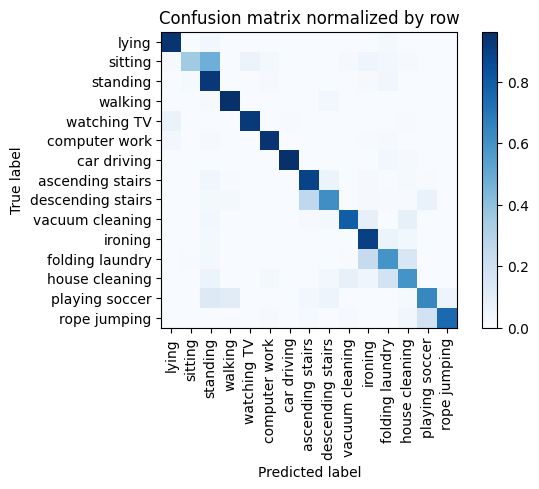

Training Epoch:   7%|▋         | 1/15 [00:53<12:33, 53.86s/it]

Overall accuracy: 0.808

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.966      0.947      0.956      0.144        636|	 lying: 0.024,	folding laundry: 0.011,	
          walking       0.968      0.960      0.964      0.108        475|	 descending stairs: 0.025,	standing: 0.011,	
          ironing       0.781      0.902      0.837      0.101        447|	 folding laundry: 0.049,	house cleaning: 0.029,	
   house cleaning       0.731      0.592      0.654      0.085        377|	 folding laundry: 0.180,	vacuum cleaning: 0.077,	
          sitting       0.957      0.352      0.515      0.085        375|	 standing: 0.475,	watching TV: 0.053,	
            lying       0.923      0.946      0.935      0.084        370|	 standing: 0.030,	folding laundry: 0.016,	
         standing       0.564      0.932      0.702      0.083        365|	 folding laundry: 0.033,	sitting: 0.014,	
  vacuum cleaning       0.877      0.789      0.8


train: 100%|██████████| 276/276 [00:50<00:00,  5.45batch/s, loss=10.8, accuracy=0.875]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 14.27batch/s, loss=10.5]


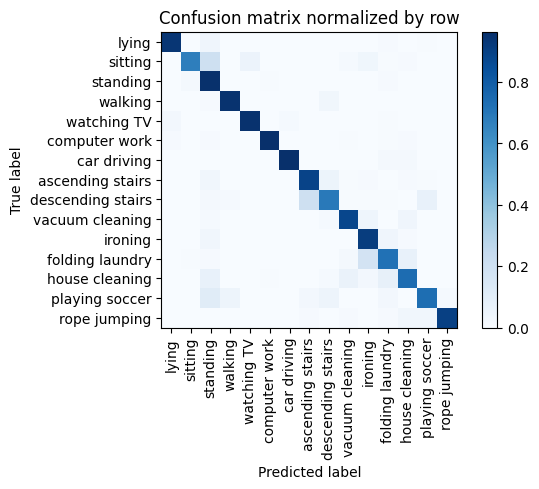

Training Epoch:  13%|█▎        | 2/15 [01:49<11:55, 55.05s/it]

Overall accuracy: 0.873

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.964      0.978      0.144        636|	 house cleaning: 0.008,	standing: 0.008,	
          walking       0.987      0.952      0.969      0.108        476|	 descending stairs: 0.034,	standing: 0.011,	
          ironing       0.839      0.913      0.874      0.101        446|	 folding laundry: 0.040,	standing: 0.034,	
   house cleaning       0.854      0.739      0.793      0.086        380|	 folding laundry: 0.079,	standing: 0.074,	
          sitting       0.958      0.672      0.790      0.085        375|	 standing: 0.203,	watching TV: 0.056,	
            lying       0.975      0.938      0.956      0.084        370|	 standing: 0.041,	folding laundry: 0.008,	
         standing       0.672      0.959      0.790      0.082        364|	 sitting: 0.022,	folding laundry: 0.008,	
  vacuum cleaning       0.882      0.880      0.881      0.0


train: 100%|██████████| 276/276 [00:53<00:00,  5.11batch/s, loss=10.8, accuracy=0.859]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 11.10batch/s, loss=11.3]


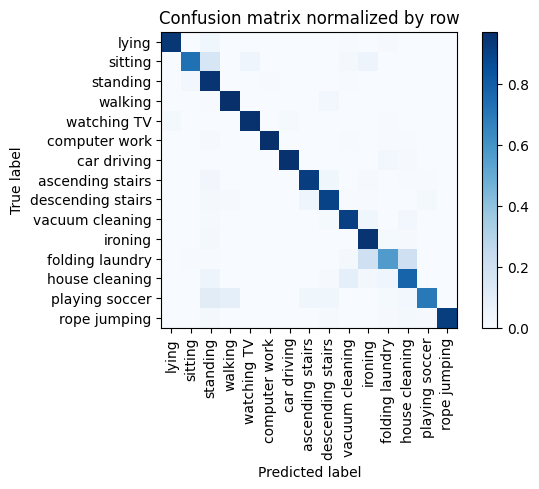

Training Epoch:  20%|██        | 3/15 [02:50<11:33, 57.77s/it]

Overall accuracy: 0.895

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.973      0.983      0.144        634|	 standing: 0.008,	house cleaning: 0.006,	
          walking       0.979      0.969      0.974      0.108        477|	 descending stairs: 0.023,	standing: 0.006,	
          ironing       0.837      0.955      0.892      0.101        447|	 standing: 0.016,	folding laundry: 0.013,	
   house cleaning       0.825      0.777      0.801      0.085        377|	 vacuum cleaning: 0.088,	standing: 0.048,	
          sitting       0.958      0.730      0.829      0.085        374|	 standing: 0.155,	ironing: 0.048,	
            lying       0.989      0.943      0.966      0.084        371|	 standing: 0.038,	folding laundry: 0.008,	
         standing       0.726      0.956      0.825      0.083        366|	 sitting: 0.025,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.856      0.909      0.882      0.077  


train: 100%|██████████| 276/276 [00:50<00:00,  5.43batch/s, loss=10.1, accuracy=0.859]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 14.76batch/s, loss=10.6]


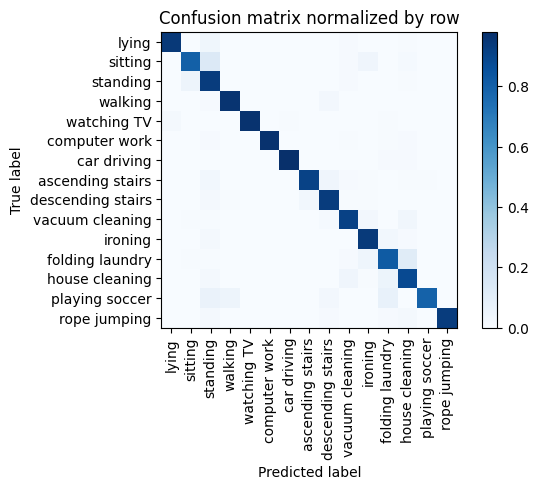

Training Epoch:  27%|██▋       | 4/15 [03:46<10:27, 57.06s/it]

Overall accuracy: 0.921

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.973      0.986      0.144        636|	 house cleaning: 0.008,	standing: 0.008,	
          walking       0.987      0.964      0.976      0.108        477|	 descending stairs: 0.025,	standing: 0.008,	
          ironing       0.919      0.940      0.929      0.101        447|	 folding laundry: 0.029,	standing: 0.018,	
   house cleaning       0.862      0.884      0.873      0.086        380|	 folding laundry: 0.050,	vacuum cleaning: 0.039,	
          sitting       0.938      0.800      0.863      0.085        375|	 standing: 0.131,	ironing: 0.040,	
            lying       0.991      0.943      0.967      0.084        370|	 standing: 0.038,	vacuum cleaning: 0.008,	
         standing       0.761      0.934      0.838      0.082        364|	 sitting: 0.047,	vacuum cleaning: 0.008,	
  vacuum cleaning       0.899      0.915      0.907      


train: 100%|██████████| 276/276 [00:50<00:00,  5.45batch/s, loss=9.9, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 14.39batch/s, loss=11.6]


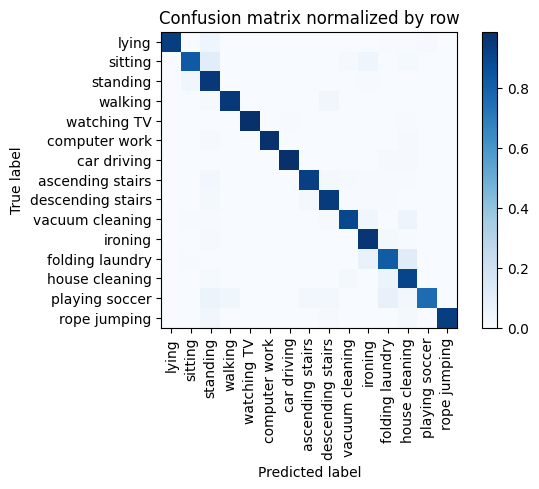

Training Epoch:  33%|███▎      | 5/15 [04:42<09:26, 56.66s/it]

Overall accuracy: 0.928

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.980      0.989      0.144        636|	 house cleaning: 0.011,	standing: 0.008,	
          walking       0.993      0.956      0.974      0.108        475|	 descending stairs: 0.032,	standing: 0.011,	
          ironing       0.899      0.962      0.929      0.100        443|	 folding laundry: 0.020,	standing: 0.011,	
   house cleaning       0.850      0.908      0.878      0.086        380|	 folding laundry: 0.053,	vacuum cleaning: 0.021,	
          sitting       0.951      0.827      0.884      0.085        375|	 standing: 0.107,	ironing: 0.045,	
            lying       1.000      0.933      0.965      0.084        371|	 standing: 0.046,	playing soccer: 0.011,	
         standing       0.783      0.954      0.860      0.083        366|	 sitting: 0.036,	ironing: 0.005,	
  vacuum cleaning       0.950      0.898      0.923      0.077    


train: 100%|██████████| 276/276 [00:53<00:00,  5.14batch/s, loss=10.6, accuracy=0.906]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.25batch/s, loss=9.3] 


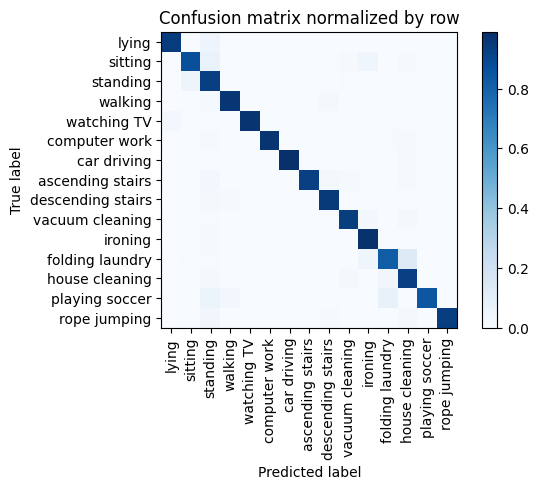

Training Epoch:  40%|████      | 6/15 [05:42<08:40, 57.79s/it]

Overall accuracy: 0.940

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.975      0.986      0.144        635|	 house cleaning: 0.011,	standing: 0.008,	
          walking       0.991      0.967      0.979      0.108        478|	 descending stairs: 0.019,	standing: 0.013,	
          ironing       0.916      0.980      0.947      0.101        447|	 standing: 0.013,	folding laundry: 0.004,	
   house cleaning       0.882      0.926      0.903      0.086        378|	 folding laundry: 0.032,	vacuum cleaning: 0.021,	
          sitting       0.942      0.869      0.904      0.085        375|	 standing: 0.069,	ironing: 0.043,	
            lying       0.989      0.946      0.967      0.084        369|	 standing: 0.049,	folding laundry: 0.003,	
         standing       0.793      0.932      0.856      0.083        365|	 sitting: 0.049,	house cleaning: 0.005,	
  vacuum cleaning       0.947      0.939      0.943      0


train: 100%|██████████| 276/276 [00:55<00:00,  4.97batch/s, loss=9.62, accuracy=1]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 15.27batch/s, loss=9.72]


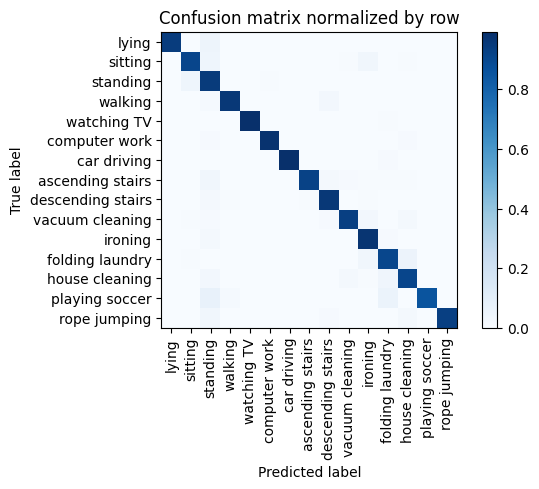

Training Epoch:  47%|████▋     | 7/15 [06:43<07:49, 58.69s/it]

Overall accuracy: 0.947

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.980      0.988      0.144        636|	 house cleaning: 0.009,	standing: 0.009,	
          walking       0.996      0.960      0.978      0.108        478|	 descending stairs: 0.025,	standing: 0.015,	
          ironing       0.929      0.973      0.951      0.101        447|	 standing: 0.016,	folding laundry: 0.009,	
   house cleaning       0.928      0.911      0.919      0.086        380|	 folding laundry: 0.039,	standing: 0.026,	
          sitting       0.945      0.912      0.928      0.085        374|	 standing: 0.043,	ironing: 0.035,	
            lying       1.000      0.946      0.972      0.084        370|	 standing: 0.049,	folding laundry: 0.003,	
         standing       0.796      0.948      0.865      0.082        363|	 sitting: 0.044,	computer work: 0.006,	
  vacuum cleaning       0.964      0.932      0.948      0.077    


train: 100%|██████████| 276/276 [00:51<00:00,  5.40batch/s, loss=9.4, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.69batch/s, loss=9.14]


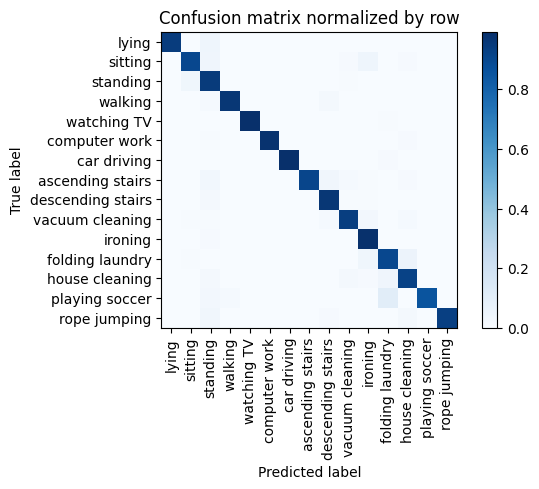

Training Epoch:  53%|█████▎    | 8/15 [07:40<06:47, 58.20s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.980      0.989      0.144        635|	 house cleaning: 0.011,	standing: 0.006,	
          walking       0.998      0.964      0.981      0.108        477|	 descending stairs: 0.021,	standing: 0.013,	
          ironing       0.917      0.987      0.950      0.101        447|	 standing: 0.011,	folding laundry: 0.002,	
   house cleaning       0.926      0.921      0.923      0.086        379|	 folding laundry: 0.040,	vacuum cleaning: 0.016,	
          sitting       0.949      0.901      0.925      0.085        374|	 ironing: 0.043,	standing: 0.040,	
            lying       1.000      0.946      0.972      0.084        370|	 standing: 0.046,	folding laundry: 0.003,	
         standing       0.830      0.951      0.886      0.083        365|	 sitting: 0.038,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.955      0.938      0.946      


train: 100%|██████████| 276/276 [00:54<00:00,  5.05batch/s, loss=10.6, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.75batch/s, loss=9.78]


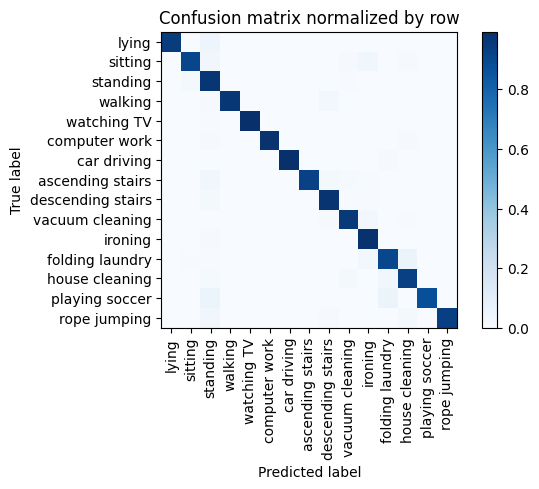

Training Epoch:  60%|██████    | 9/15 [08:40<05:53, 58.96s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.979      0.989      0.143        633|	 house cleaning: 0.009,	standing: 0.008,	
          walking       1.000      0.964      0.982      0.108        478|	 descending stairs: 0.025,	standing: 0.008,	
          ironing       0.928      0.984      0.955      0.101        447|	 standing: 0.011,	house cleaning: 0.002,	
   house cleaning       0.931      0.931      0.931      0.086        379|	 folding laundry: 0.032,	vacuum cleaning: 0.021,	
          sitting       0.974      0.909      0.941      0.085        375|	 ironing: 0.037,	standing: 0.035,	
            lying       1.000      0.946      0.972      0.084        370|	 standing: 0.049,	folding laundry: 0.003,	
         standing       0.831      0.970      0.895      0.083        365|	 sitting: 0.019,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.950      0.953      0.952      0


train: 100%|██████████| 276/276 [00:53<00:00,  5.12batch/s, loss=10.3, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.66batch/s, loss=9.78]


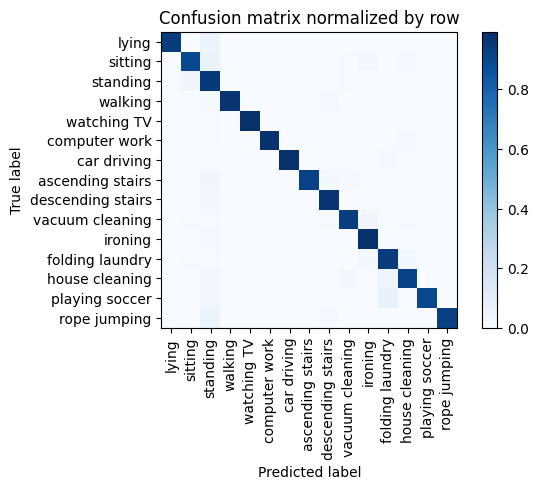

Training Epoch:  67%|██████▋   | 10/15 [09:41<04:56, 59.29s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.983      0.990      0.144        636|	 house cleaning: 0.008,	standing: 0.006,	
          walking       1.000      0.977      0.988      0.108        476|	 standing: 0.013,	descending stairs: 0.011,	
          ironing       0.940      0.987      0.963      0.101        448|	 standing: 0.011,	folding laundry: 0.002,	
   house cleaning       0.953      0.918      0.935      0.086        378|	 folding laundry: 0.042,	vacuum cleaning: 0.016,	
          sitting       0.958      0.899      0.927      0.085        376|	 standing: 0.064,	ironing: 0.021,	
            lying       1.000      0.946      0.972      0.084        369|	 standing: 0.051,	folding laundry: 0.003,	
         standing       0.799      0.956      0.870      0.082        362|	 sitting: 0.033,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.964      0.941      0.953      


train: 100%|██████████| 276/276 [00:53<00:00,  5.19batch/s, loss=10.4, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.18batch/s, loss=10]  


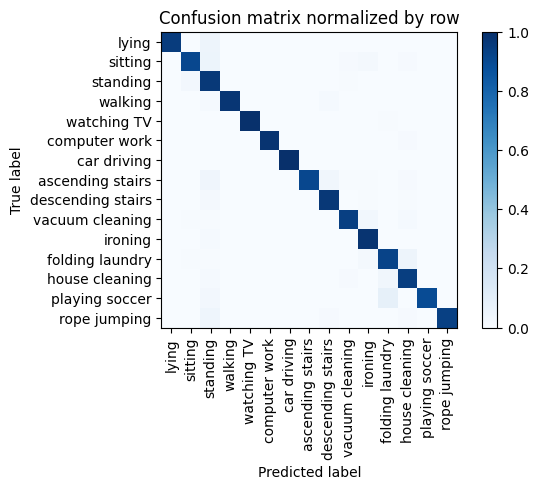

Training Epoch:  73%|███████▎  | 11/15 [10:40<03:56, 59.21s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.984      0.991      0.144        634|	 house cleaning: 0.011,	standing: 0.003,	
          walking       1.000      0.973      0.986      0.108        477|	 descending stairs: 0.013,	standing: 0.013,	
          ironing       0.944      0.984      0.964      0.101        447|	 standing: 0.013,	folding laundry: 0.002,	
   house cleaning       0.925      0.942      0.933      0.086        378|	 folding laundry: 0.034,	standing: 0.013,	
          sitting       0.966      0.906      0.935      0.085        374|	 standing: 0.053,	ironing: 0.019,	
            lying       1.000      0.951      0.975      0.084        371|	 standing: 0.049,	rope jumping: 0.000,	
         standing       0.817      0.964      0.885      0.083        366|	 sitting: 0.025,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.973      0.941      0.957      0.077     


train: 100%|██████████| 276/276 [00:53<00:00,  5.17batch/s, loss=10, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.11batch/s, loss=9.58]


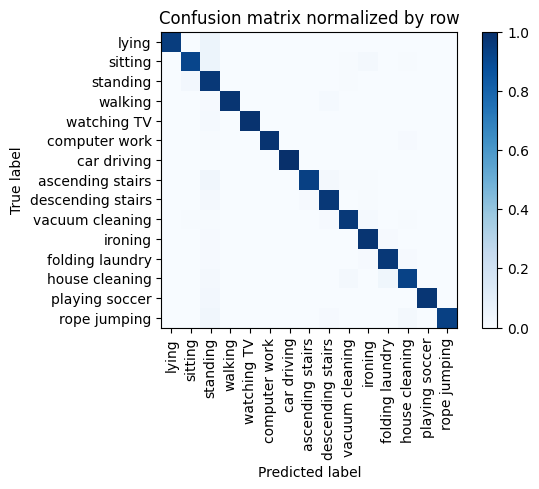

Training Epoch:  80%|████████  | 12/15 [11:39<02:57, 59.22s/it]

Overall accuracy: 0.961

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.983      0.990      0.144        635|	 house cleaning: 0.008,	standing: 0.006,	
          walking       1.000      0.977      0.988      0.108        476|	 descending stairs: 0.013,	standing: 0.011,	
          ironing       0.963      0.980      0.971      0.101        447|	 folding laundry: 0.011,	standing: 0.009,	
   house cleaning       0.964      0.929      0.946      0.086        379|	 folding laundry: 0.037,	vacuum cleaning: 0.016,	
          sitting       0.969      0.917      0.942      0.085        374|	 standing: 0.053,	ironing: 0.019,	
            lying       1.000      0.946      0.972      0.084        370|	 standing: 0.051,	descending stairs: 0.003,	
         standing       0.814      0.967      0.884      0.082        363|	 sitting: 0.025,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.968      0.962      0.965    


train: 100%|██████████| 276/276 [00:51<00:00,  5.33batch/s, loss=9.31, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 13.92batch/s, loss=8.59]


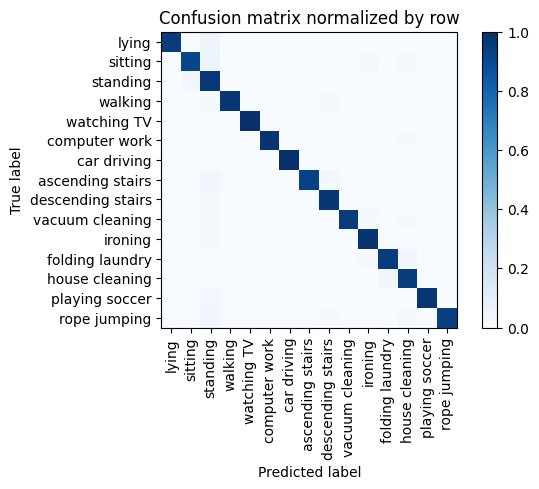

Training Epoch:  87%|████████▋ | 13/15 [12:36<01:57, 58.66s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.984      0.991      0.144        634|	 house cleaning: 0.011,	standing: 0.003,	
          walking       1.000      0.973      0.986      0.108        477|	 standing: 0.015,	descending stairs: 0.013,	
          ironing       0.963      0.980      0.971      0.101        446|	 standing: 0.016,	folding laundry: 0.004,	
   house cleaning       0.940      0.953      0.946      0.086        380|	 folding laundry: 0.032,	vacuum cleaning: 0.005,	
          sitting       0.966      0.912      0.938      0.085        376|	 standing: 0.053,	ironing: 0.016,	
            lying       1.000      0.951      0.975      0.084        371|	 standing: 0.049,	rope jumping: 0.000,	
         standing       0.821      0.967      0.888      0.083        365|	 sitting: 0.025,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.979      0.956      0.967      0.0


train: 100%|██████████| 276/276 [00:53<00:00,  5.19batch/s, loss=10.2, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.47batch/s, loss=9.63]


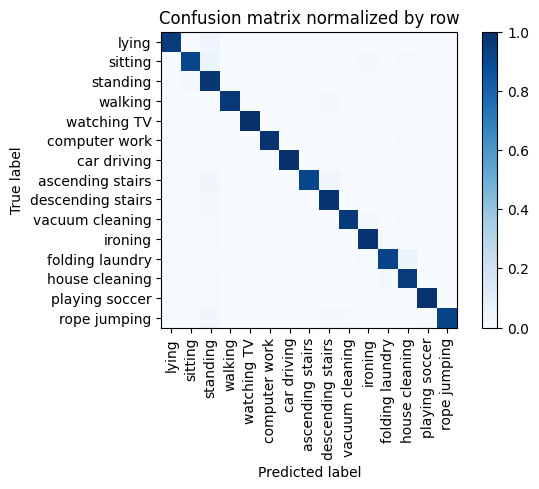

Training Epoch:  93%|█████████▎| 14/15 [13:35<00:58, 58.76s/it]

Overall accuracy: 0.961

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.984      0.991      0.144        636|	 house cleaning: 0.011,	standing: 0.003,	
          walking       1.000      0.967      0.983      0.108        478|	 descending stairs: 0.023,	standing: 0.010,	
          ironing       0.954      0.982      0.968      0.101        446|	 folding laundry: 0.009,	standing: 0.009,	
   house cleaning       0.935      0.955      0.945      0.085        377|	 folding laundry: 0.019,	vacuum cleaning: 0.013,	
          sitting       0.977      0.912      0.943      0.085        374|	 standing: 0.051,	ironing: 0.021,	
            lying       1.000      0.951      0.975      0.084        369|	 standing: 0.046,	descending stairs: 0.003,	
         standing       0.835      0.970      0.898      0.083        366|	 sitting: 0.019,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.965      0.962      0.963    


train: 100%|██████████| 276/276 [00:50<00:00,  5.42batch/s, loss=10.1, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:04<00:00, 14.95batch/s, loss=9.17]


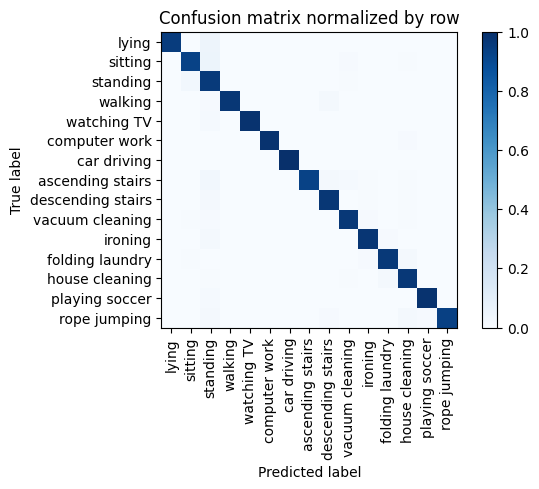

Overall accuracy: 0.964

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.986      0.992      0.143        633|	 house cleaning: 0.011,	ironing: 0.002,	
          walking       1.000      0.971      0.985      0.108        477|	 descending stairs: 0.017,	standing: 0.010,	
          ironing       0.980      0.973      0.976      0.101        445|	 standing: 0.016,	folding laundry: 0.009,	
   house cleaning       0.946      0.966      0.955      0.086        378|	 folding laundry: 0.021,	vacuum cleaning: 0.005,	
          sitting       0.961      0.928      0.945      0.085        376|	 standing: 0.053,	vacuum cleaning: 0.008,	
            lying       1.000      0.951      0.975      0.084        370|	 standing: 0.049,	rope jumping: 0.000,	
         standing       0.831      0.959      0.891      0.083        365|	 sitting: 0.030,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.968      0.968      0.968  

torch.Size([3, 2048])


unseen: 100%|██████████| 68/68 [00:04<00:00, 15.20batch/s, loss=14.2]


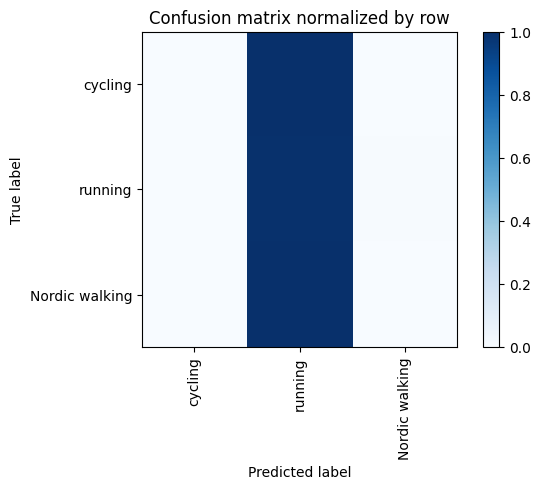

Overall accuracy: 0.216

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.000      0.000      0.000      0.419       1824|	 running: 1.000,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1583|	 running: 1.000,	Nordic walking: 0.000,	
       running       0.216      0.994      0.355      0.217        945|	 Nordic walking: 0.006,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.047      0.216      0.077        1.0       4352|	      

{'accuracy': 0.21576286764705882, 'precision': 0.07202024850437184, 'recall': 0.33121693121693124, 'f1': 0.11831411831411831}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1,

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 15, 16, 17]
unseen classes >  [13, 9, 14]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 283/283 [00:47<00:00,  5.96batch/s, loss=12.2, accuracy=0.859]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.42batch/s, loss=10]


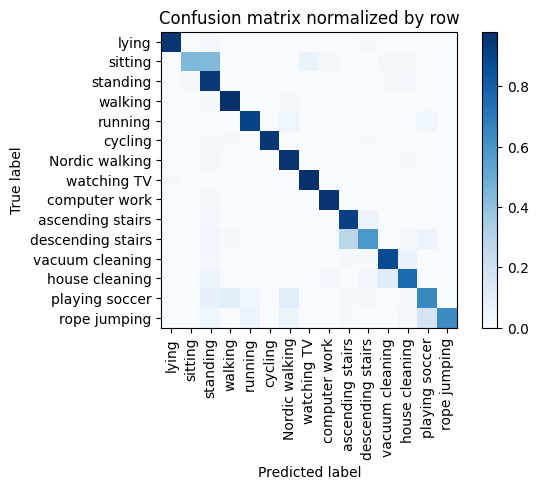

Training Epoch:   7%|▋         | 1/15 [00:52<12:14, 52.47s/it]

Overall accuracy: 0.865

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.962      0.964      0.963      0.131        585|	 standing: 0.022,	house cleaning: 0.005,	
          walking       0.953      0.978      0.966      0.102        459|	 standing: 0.011,	Nordic walking: 0.009,	
   house cleaning       0.859      0.768      0.811      0.089        397|	 vacuum cleaning: 0.111,	standing: 0.055,	
         standing       0.587      0.949      0.725      0.082        369|	 house cleaning: 0.024,	vacuum cleaning: 0.014,	
   Nordic walking       0.927      0.966      0.946      0.079        355|	 standing: 0.017,	house cleaning: 0.008,	
          sitting       0.969      0.441      0.606      0.078        349|	 standing: 0.438,	watching TV: 0.063,	
            lying       0.988      0.957      0.972      0.077        346|	 standing: 0.026,	descending stairs: 0.012,	
          cycling       0.994      0.953      0.973    


train: 100%|██████████| 283/283 [00:47<00:00,  5.98batch/s, loss=10.1, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.90batch/s, loss=9.87]


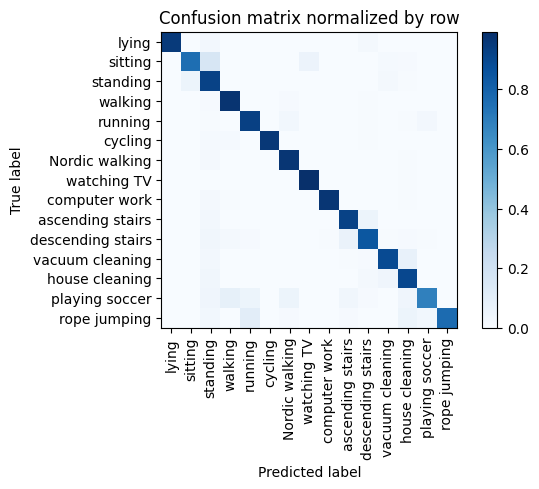

Training Epoch:  13%|█▎        | 2/15 [01:44<11:22, 52.48s/it]

Overall accuracy: 0.917

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.968      0.981      0.131        589|	 standing: 0.017,	house cleaning: 0.007,	
          walking       0.953      0.978      0.965      0.102        457|	 Nordic walking: 0.009,	standing: 0.009,	
   house cleaning       0.876      0.903      0.889      0.087        392|	 vacuum cleaning: 0.041,	standing: 0.033,	
         standing       0.724      0.922      0.811      0.083        372|	 sitting: 0.054,	vacuum cleaning: 0.016,	
   Nordic walking       0.959      0.969      0.964      0.080        359|	 standing: 0.017,	house cleaning: 0.006,	
          sitting       0.924      0.756      0.832      0.079        353|	 standing: 0.159,	watching TV: 0.057,	
            lying       1.000      0.951      0.975      0.078        349|	 standing: 0.026,	descending stairs: 0.017,	
  vacuum cleaning       0.910      0.891      0.901      0.076


train: 100%|██████████| 283/283 [00:48<00:00,  5.83batch/s, loss=10, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.13batch/s, loss=10.2]


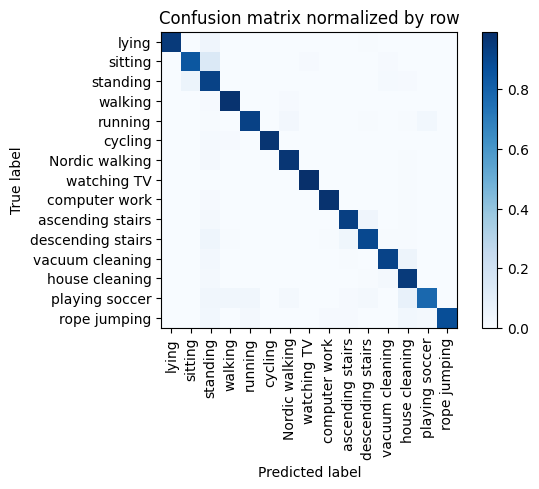

Training Epoch:  20%|██        | 3/15 [02:38<10:35, 52.99s/it]

Overall accuracy: 0.940

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.981      0.988      0.131        588|	 standing: 0.010,	house cleaning: 0.005,	
          walking       0.978      0.978      0.978      0.102        459|	 Nordic walking: 0.009,	standing: 0.009,	
   house cleaning       0.906      0.955      0.930      0.088        396|	 vacuum cleaning: 0.020,	standing: 0.018,	
         standing       0.743      0.922      0.823      0.083        371|	 sitting: 0.054,	vacuum cleaning: 0.013,	
   Nordic walking       0.972      0.969      0.971      0.080        358|	 standing: 0.017,	house cleaning: 0.006,	
          sitting       0.931      0.844      0.886      0.079        353|	 standing: 0.136,	watching TV: 0.011,	
          cycling       1.000      0.971      0.985      0.077        343|	 standing: 0.015,	walking: 0.009,	
            lying       1.000      0.953      0.976      0.077        34


train: 100%|██████████| 283/283 [00:48<00:00,  5.88batch/s, loss=10.1, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.14batch/s, loss=9.91]


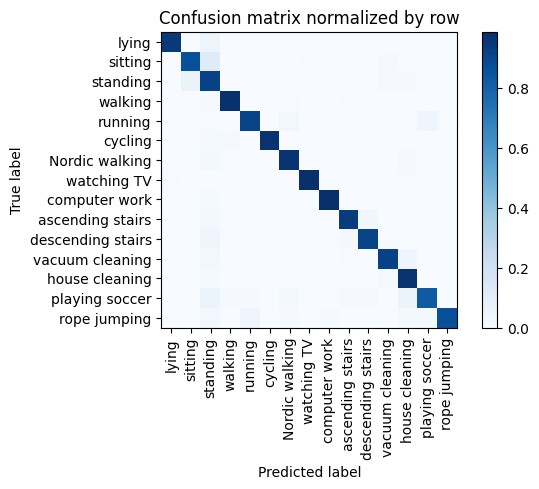

Training Epoch:  27%|██▋       | 4/15 [03:31<09:44, 53.10s/it]

Overall accuracy: 0.944

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.985      0.990      0.132        591|	 standing: 0.012,	house cleaning: 0.002,	
          walking       0.991      0.976      0.983      0.102        457|	 standing: 0.011,	Nordic walking: 0.007,	
   house cleaning       0.921      0.975      0.947      0.089        397|	 vacuum cleaning: 0.013,	standing: 0.013,	
         standing       0.739      0.916      0.818      0.082        368|	 sitting: 0.062,	vacuum cleaning: 0.011,	
          sitting       0.925      0.865      0.894      0.079        356|	 standing: 0.118,	vacuum cleaning: 0.011,	
   Nordic walking       0.972      0.966      0.969      0.079        355|	 standing: 0.020,	house cleaning: 0.008,	
            lying       0.997      0.946      0.971      0.078        349|	 standing: 0.049,	descending stairs: 0.006,	
          cycling       1.000      0.973      0.987      0


train: 100%|██████████| 283/283 [00:48<00:00,  5.86batch/s, loss=10.5, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.97batch/s, loss=9.63]


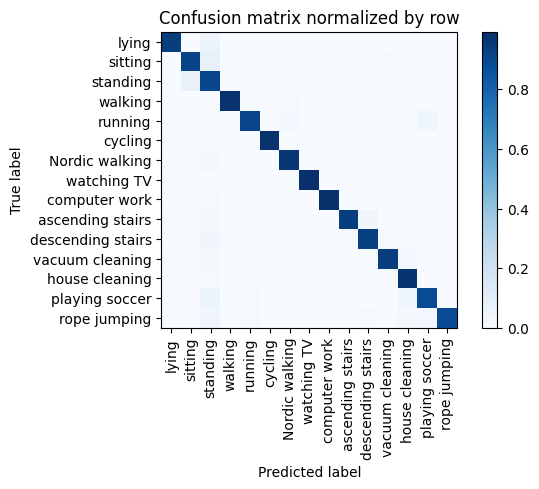

Training Epoch:  33%|███▎      | 5/15 [04:25<08:51, 53.20s/it]

Overall accuracy: 0.953

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.986      0.991      0.132        590|	 standing: 0.012,	house cleaning: 0.002,	
          walking       0.993      0.978      0.986      0.103        460|	 Nordic walking: 0.009,	standing: 0.009,	
   house cleaning       0.941      0.977      0.959      0.088        395|	 vacuum cleaning: 0.013,	standing: 0.010,	
         standing       0.774      0.903      0.833      0.083        371|	 sitting: 0.073,	house cleaning: 0.011,	
   Nordic walking       0.978      0.969      0.974      0.080        360|	 standing: 0.017,	house cleaning: 0.003,	
          sitting       0.915      0.918      0.916      0.079        352|	 standing: 0.071,	vacuum cleaning: 0.011,	
            lying       1.000      0.939      0.969      0.077        347|	 standing: 0.061,	rope jumping: 0.000,	
          cycling       1.000      0.979      0.990      0.076  


train: 100%|██████████| 283/283 [00:48<00:00,  5.83batch/s, loss=9.77, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.62batch/s, loss=9.39]


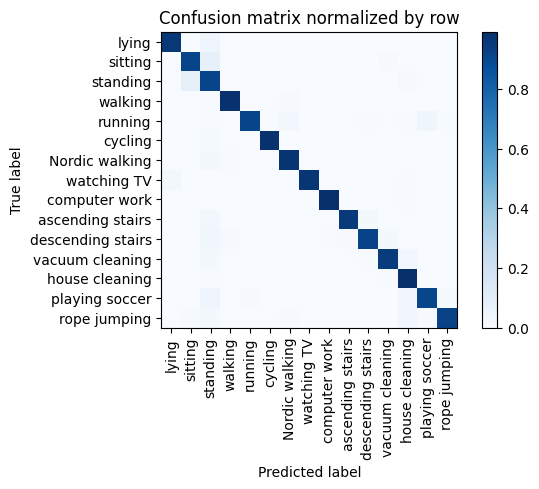

Training Epoch:  40%|████      | 6/15 [05:18<08:00, 53.37s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.991      0.995      0.131        587|	 house cleaning: 0.005,	standing: 0.003,	
          walking       0.989      0.982      0.986      0.102        456|	 Nordic walking: 0.009,	standing: 0.007,	
   house cleaning       0.938      0.985      0.961      0.090        401|	 vacuum cleaning: 0.007,	standing: 0.007,	
         standing       0.792      0.910      0.847      0.082        368|	 sitting: 0.079,	house cleaning: 0.011,	
   Nordic walking       0.975      0.969      0.972      0.080        358|	 standing: 0.017,	walking: 0.006,	
          sitting       0.910      0.912      0.911      0.079        354|	 standing: 0.079,	vacuum cleaning: 0.008,	
            lying       0.988      0.957      0.972      0.077        346|	 standing: 0.043,	rope jumping: 0.000,	
          cycling       1.000      0.982      0.991      0.076        3


train: 100%|██████████| 283/283 [00:49<00:00,  5.72batch/s, loss=10.9, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.09batch/s, loss=10.3]


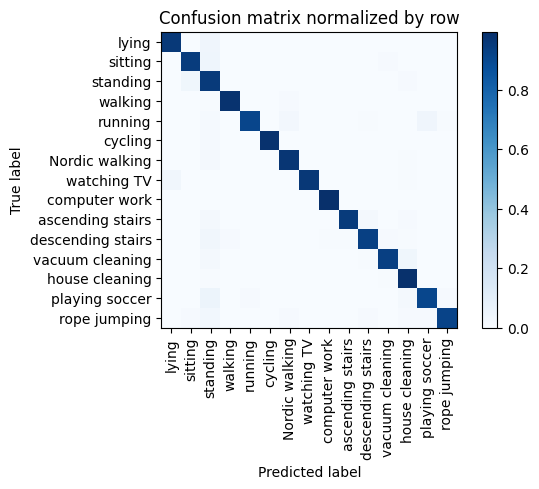

Training Epoch:  47%|████▋     | 7/15 [06:13<07:11, 53.88s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.995      0.996      0.130        584|	 standing: 0.003,	house cleaning: 0.002,	
          walking       0.993      0.983      0.988      0.102        458|	 Nordic walking: 0.009,	standing: 0.007,	
   house cleaning       0.935      0.987      0.960      0.087        391|	 standing: 0.008,	vacuum cleaning: 0.005,	
         standing       0.823      0.954      0.884      0.083        370|	 sitting: 0.035,	house cleaning: 0.011,	
   Nordic walking       0.975      0.969      0.972      0.080        358|	 standing: 0.017,	house cleaning: 0.006,	
          sitting       0.957      0.947      0.952      0.079        356|	 standing: 0.045,	vacuum cleaning: 0.008,	
            lying       0.985      0.957      0.971      0.077        345|	 standing: 0.041,	computer work: 0.003,	
          cycling       1.000      0.985      0.993      0.077 


train: 100%|██████████| 283/283 [00:48<00:00,  5.81batch/s, loss=10.4, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.78batch/s, loss=9.37]


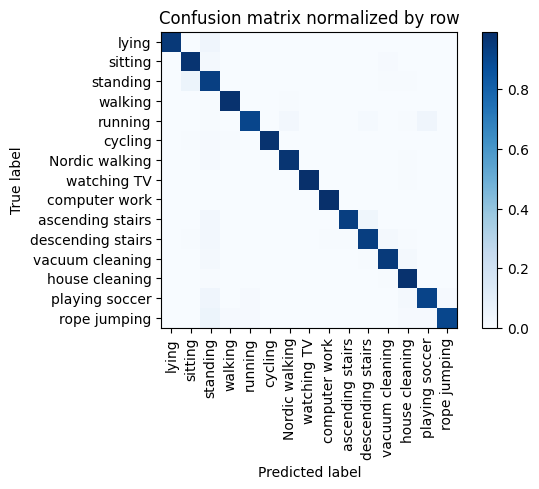

Training Epoch:  53%|█████▎    | 8/15 [07:07<06:17, 53.89s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.993      0.995      0.132        591|	 house cleaning: 0.003,	standing: 0.003,	
          walking       0.991      0.985      0.988      0.102        456|	 Nordic walking: 0.007,	standing: 0.007,	
   house cleaning       0.953      0.985      0.969      0.088        395|	 vacuum cleaning: 0.008,	standing: 0.008,	
         standing       0.844      0.935      0.887      0.083        371|	 sitting: 0.054,	house cleaning: 0.005,	
   Nordic walking       0.980      0.972      0.976      0.079        355|	 standing: 0.014,	house cleaning: 0.006,	
          sitting       0.935      0.975      0.954      0.079        353|	 standing: 0.017,	vacuum cleaning: 0.008,	
            lying       1.000      0.957      0.978      0.077        346|	 standing: 0.040,	computer work: 0.003,	
  vacuum cleaning       0.961      0.953      0.957      0.076 


train: 100%|██████████| 283/283 [00:48<00:00,  5.82batch/s, loss=9.93, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.72batch/s, loss=8.78]


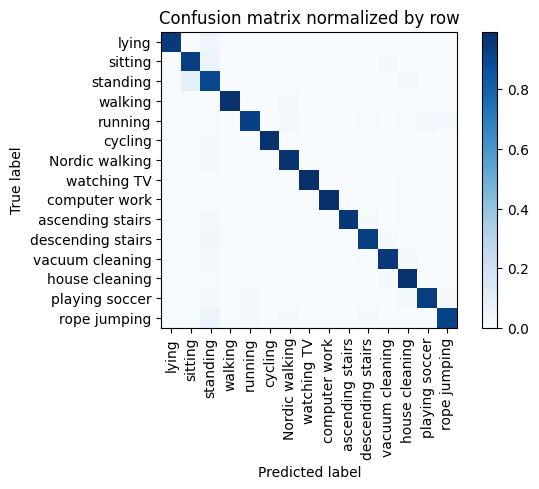

Training Epoch:  60%|██████    | 9/15 [08:01<05:23, 53.87s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.991      0.994      0.131        585|	 house cleaning: 0.005,	standing: 0.003,	
          walking       1.000      0.980      0.990      0.102        458|	 Nordic walking: 0.009,	standing: 0.007,	
   house cleaning       0.954      0.982      0.968      0.089        397|	 vacuum cleaning: 0.010,	standing: 0.008,	
         standing       0.801      0.902      0.849      0.082        367|	 sitting: 0.084,	house cleaning: 0.014,	
   Nordic walking       0.978      0.975      0.976      0.080        358|	 standing: 0.017,	house cleaning: 0.003,	
          sitting       0.912      0.932      0.922      0.079        354|	 standing: 0.059,	vacuum cleaning: 0.008,	
            lying       1.000      0.951      0.975      0.078        348|	 standing: 0.046,	computer work: 0.003,	
  vacuum cleaning       0.968      0.959      0.963      0.077 


train: 100%|██████████| 283/283 [00:48<00:00,  5.84batch/s, loss=9.83, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.12batch/s, loss=9.19]


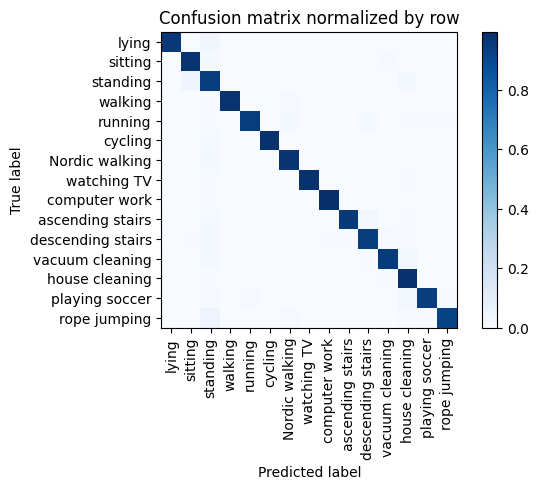

Training Epoch:  67%|██████▋   | 10/15 [08:55<04:28, 53.77s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.995      0.996      0.131        589|	 standing: 0.005,	rope jumping: 0.000,	
          walking       0.998      0.983      0.990      0.103        460|	 Nordic walking: 0.009,	standing: 0.007,	
   house cleaning       0.941      0.985      0.963      0.087        392|	 vacuum cleaning: 0.008,	standing: 0.008,	
         standing       0.856      0.941      0.897      0.083        373|	 sitting: 0.043,	house cleaning: 0.016,	
   Nordic walking       0.978      0.972      0.975      0.081        361|	 standing: 0.017,	house cleaning: 0.003,	
          sitting       0.948      0.972      0.960      0.079        356|	 standing: 0.020,	vacuum cleaning: 0.008,	
            lying       1.000      0.963      0.981      0.077        347|	 standing: 0.032,	house cleaning: 0.003,	
  vacuum cleaning       0.970      0.950      0.960      0.075  


train: 100%|██████████| 283/283 [00:52<00:00,  5.44batch/s, loss=9.62, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.71batch/s, loss=9.28]


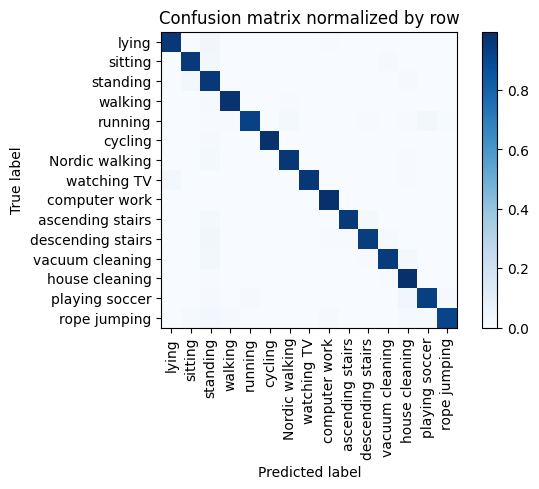

Training Epoch:  73%|███████▎  | 11/15 [09:52<03:39, 54.83s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.997      0.993      0.131        588|	 standing: 0.003,	rope jumping: 0.000,	
          walking       0.993      0.985      0.989      0.102        458|	 standing: 0.009,	Nordic walking: 0.004,	
   house cleaning       0.953      0.990      0.971      0.087        392|	 vacuum cleaning: 0.005,	standing: 0.005,	
         standing       0.847      0.962      0.901      0.082        369|	 sitting: 0.024,	house cleaning: 0.011,	
   Nordic walking       0.986      0.969      0.977      0.079        356|	 standing: 0.017,	house cleaning: 0.006,	
          sitting       0.969      0.961      0.965      0.079        356|	 standing: 0.031,	vacuum cleaning: 0.008,	
            lying       0.988      0.963      0.975      0.078        348|	 standing: 0.032,	computer work: 0.006,	
          cycling       1.000      0.985      0.993      0.077   


train: 100%|██████████| 283/283 [00:48<00:00,  5.83batch/s, loss=11.4, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.67batch/s, loss=8.99]


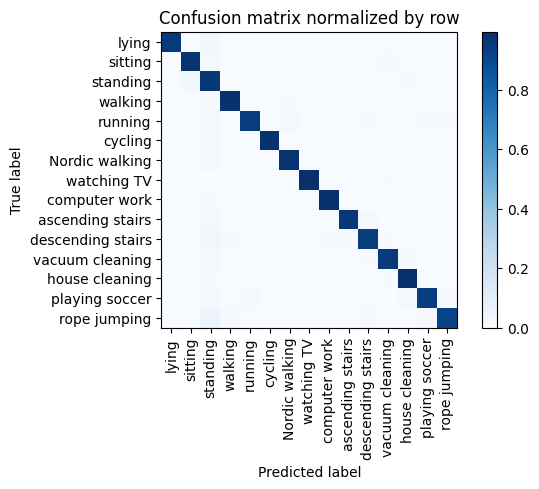

Training Epoch:  80%|████████  | 12/15 [10:46<02:43, 54.52s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.995      0.996      0.130        584|	 standing: 0.005,	rope jumping: 0.000,	
          walking       0.991      0.987      0.989      0.102        456|	 standing: 0.007,	Nordic walking: 0.004,	
   house cleaning       0.975      0.987      0.981      0.088        396|	 standing: 0.008,	vacuum cleaning: 0.005,	
         standing       0.848      0.962      0.901      0.083        370|	 sitting: 0.030,	house cleaning: 0.005,	
   Nordic walking       0.986      0.978      0.982      0.080        359|	 standing: 0.017,	vacuum cleaning: 0.003,	
          sitting       0.964      0.972      0.968      0.079        354|	 standing: 0.020,	vacuum cleaning: 0.008,	
            lying       1.000      0.959      0.979      0.077        344|	 standing: 0.038,	computer work: 0.003,	
          cycling       1.000      0.985      0.993      0.076  


train: 100%|██████████| 283/283 [00:51<00:00,  5.46batch/s, loss=9.32, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.25batch/s, loss=9.28]


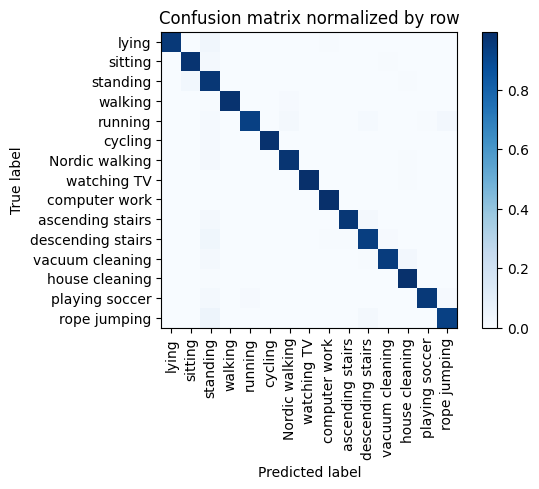

Training Epoch:  87%|████████▋ | 13/15 [11:43<01:50, 55.38s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.995      0.995      0.132        590|	 standing: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.982      0.991      0.102        457|	 Nordic walking: 0.009,	standing: 0.007,	
   house cleaning       0.963      0.990      0.976      0.089        397|	 standing: 0.008,	vacuum cleaning: 0.003,	
         standing       0.848      0.965      0.903      0.083        370|	 sitting: 0.030,	house cleaning: 0.005,	
   Nordic walking       0.980      0.972      0.976      0.080        357|	 standing: 0.017,	house cleaning: 0.006,	
          sitting       0.966      0.977      0.972      0.078        351|	 standing: 0.017,	vacuum cleaning: 0.006,	
            lying       1.000      0.959      0.979      0.077        345|	 standing: 0.035,	computer work: 0.006,	
          cycling       1.000      0.985      0.993      0.076 


train: 100%|██████████| 283/283 [00:51<00:00,  5.45batch/s, loss=10.1, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.41batch/s, loss=9.12]


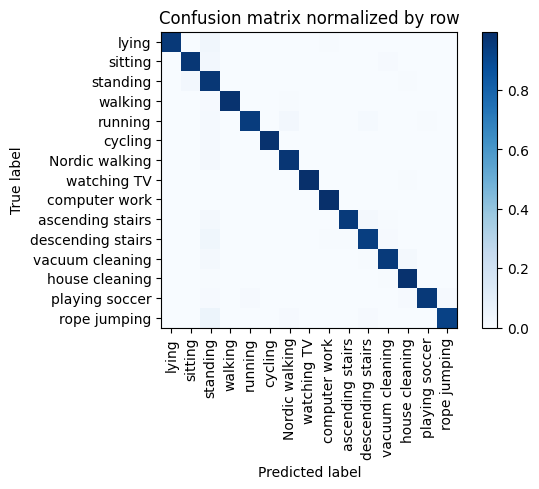

Training Epoch:  93%|█████████▎| 14/15 [12:40<00:55, 55.94s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.997      0.995      0.131        587|	 house cleaning: 0.002,	standing: 0.002,	
          walking       0.996      0.985      0.990      0.102        456|	 standing: 0.009,	Nordic walking: 0.004,	
   house cleaning       0.970      0.987      0.979      0.089        399|	 standing: 0.008,	vacuum cleaning: 0.005,	
         standing       0.847      0.968      0.904      0.083        373|	 sitting: 0.024,	house cleaning: 0.005,	
   Nordic walking       0.980      0.972      0.976      0.080        359|	 standing: 0.017,	house cleaning: 0.003,	
          sitting       0.971      0.966      0.969      0.079        352|	 standing: 0.026,	vacuum cleaning: 0.009,	
            lying       1.000      0.959      0.979      0.077        344|	 standing: 0.035,	computer work: 0.006,	
          cycling       1.000      0.985      0.993      0.076 


train: 100%|██████████| 283/283 [00:52<00:00,  5.36batch/s, loss=9, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.85batch/s, loss=9.44]


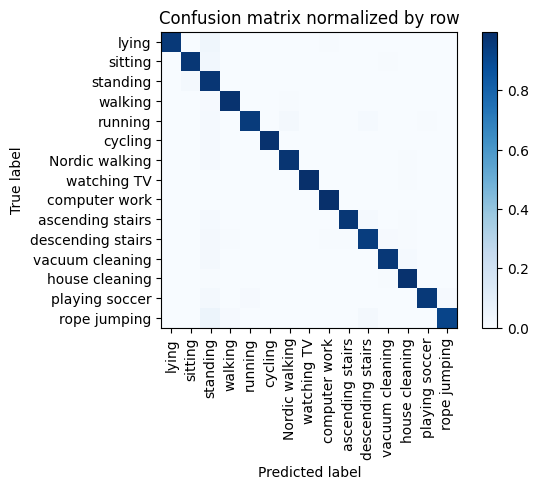

Overall accuracy: 0.975

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.997      0.995      0.131        589|	 standing: 0.003,	rope jumping: 0.000,	
          walking       0.996      0.985      0.990      0.102        458|	 standing: 0.009,	Nordic walking: 0.004,	
   house cleaning       0.975      0.987      0.981      0.088        396|	 standing: 0.008,	vacuum cleaning: 0.005,	
         standing       0.849      0.973      0.907      0.083        370|	 sitting: 0.019,	house cleaning: 0.003,	
   Nordic walking       0.986      0.975      0.980      0.080        358|	 standing: 0.014,	house cleaning: 0.006,	
          sitting       0.977      0.966      0.972      0.079        353|	 standing: 0.028,	vacuum cleaning: 0.006,	
            lying       1.000      0.959      0.979      0.076        342|	 standing: 0.035,	computer work: 0.006,	
  vacuum cleaning       0.973      0.965      0.969      0.076   

unseen: 100%|██████████| 60/60 [00:03<00:00, 15.19batch/s, loss=13.3]


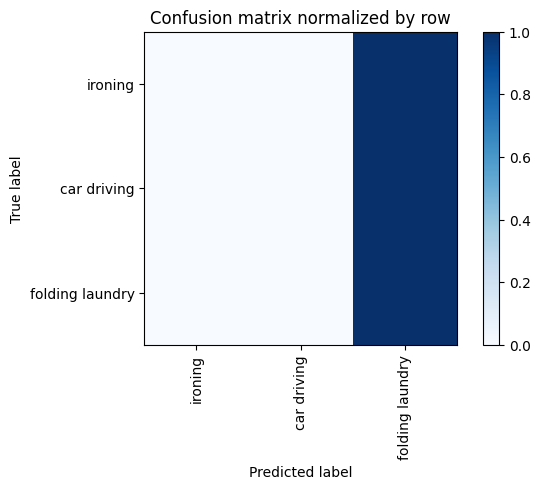

Overall accuracy: 0.253

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.607       2331|	 folding laundry: 1.000,	car driving: 0.000,	
folding laundry       0.253      1.000      0.404      0.253        973|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.064      0.253      0.102        1.0       3840|	      

{'accuracy': 0.25338541666666664, 'precision': 0.08446180555555555, 'recall': 0.3333333333333333, 'f1': 0.13477387630722348}
============== Overall Unseen Classes Performance ==============


accuracy     0.385048
precision    0.362602
recall       0.429870
f1           0.326246
dtype: float64

In [38]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="mean"), 'feature': nn.L1Loss(reduction="mean")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
